# Contents

1. [Reading and Showing Images](#1)
1. [Changing Colorspaces](#2)
1. [Create Histogram](#3)
1. [Histogram Equalization](#4)
     * [Adaptive Histogram Equalization](#5)
1. [Thresholding](#6)
1. [Image Resizing](#7)
1. [Drawing and Writing in Images](#8)
1. [Arithmetic Operations on Images](#9)
    * [Image Addition](#10)
    * [Image Blending](#11)
    * [Bitwise Operations](#12)
1. [Morphological Transformations](#13)
    * [1. Erosion](#14)
    * [2. Dilation](#15)
    * [3. Opening](#16)
	* [4. Closing](#17)
	* [5. Morphological Gradient](#18)
	* [Structuring Element](#19) 
1. [Image Smoothing](#20)
1. [Perspective Warping](#21)
1. [Shifting and Rotation](#22)
1. [Harris Corner Detection](#23)
1. [Shi-Tomasi Corner Detector & Good Features to Track](#24)
1. [Image Gradients](#25)
1. [Canny Edge Detection](#26)
1. [Contours](#27)
    * [Contour Features](#28)  
        * [1. Moments](#29)  
        * [2. Contour Area](#30) 
		* [3. Contour Perimeter](#31)  
		* [4. Contour Approximation](#32) 
		* [5. Convex Hull](#33) 
		* [6. Bounding Rectangle](#34)
			* [6.1. Straight Bounding Rectangle](#35)     
			* [6.2 Rotated Rectangle](#36)            
1. [Template Matching](#37)
1. [Probabilistic Hough Line Transform](#38)
1. [Hough Circle Transform](#39)
1. [Haar Cascades](#40)
	* [1. Face Detection](#41)   
	* [2. Eye Detection](#42)    
	* [3. Mouth Detection](#43)    
	* [4. Smile Detection](#44)    
	* [5. Simple Mask Detection](#45)

# Import Libraries

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# We are using the warning library to avoid getting a warning, it is not a big deal.
import warnings
warnings.filterwarnings("ignore")

<a id = "1"></a><br>
# Reading and Showing Images

In [2]:
image_path= "...\\Github\\Basic OpenCV Tutorial\\Images\\map.jpg"
image= cv2.imread(image_path) #by default cv2.imread method reads the image in BGR format

In [3]:
# if you would like, you can use cv2.imshow for show the image
window_name= "Image"
cv2.imshow(window_name, image) # shows the image
milliseconds= 0 # if milliseconds = 0, image window stays on until you press any button
cv2.waitKey(milliseconds) # if i press any button, close the image window
cv2.destroyAllWindows() # closes all currently open windows

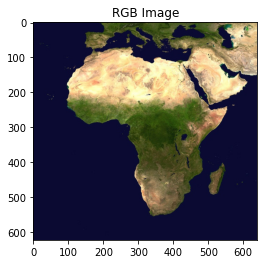

In [4]:
# I will use pyplot in this notebook, because I want to show you the output image
# pyplot shows the image in RGB format so I need to convert the color format
img= cv2.cvtColor(image, cv2.COLOR_BGR2RGB) # converting the BGR color format to RGB
plt.imshow(img), plt.title("RGB Image"); # shows the image and add title

In [5]:
flag= cv2.IMREAD_GRAYSCALE # or we could use 0 for the flag
# If we change the flag, cv2.imread method reads in a different color format, i used cv2.IMREAD_GRAYSCALE for the flag
image_gray= cv2.imread(image_path, flag) 
# you can also look at other flags

cv2.imread flags :

* cv2.IMREAD_COLOR: It specifies to load a color image. Any transparency of image will be neglected. It is the default flag. Alternatively, we can pass integer value 1 for this flag.

* cv2.IMREAD_GRAYSCALE: It specifies to load an image in grayscale mode. Alternatively, we can pass integer value 0 for this flag.

* cv2.IMREAD_UNCHANGED: It specifies to load an image as such including alpha channel. Alternatively, we can pass integer value -1 for this flag.

In [6]:
window_name= "Gray Image"
cv2.imshow(window_name, image_gray) 
cv2.waitKey(0)
cv2.destroyAllWindows() 

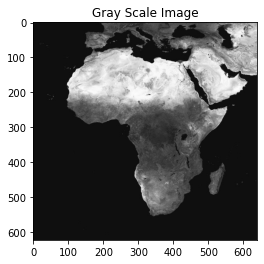

In [7]:
# default cmap value of the pyplot method is RGB, so we need to change the cmap
cmap= "gray" # cmap should be "gray" for grayscale images
plt.imshow(image_gray, cmap= cmap), plt.title("Gray Scale Image");

<a id = "2"></a><br>
# Changing Colorspaces

* BGR to RGB
* BGR to GRAY
* BGR to HSV

In [8]:
# we already saw converting to RGB
bgr_image= cv2.imread("...\\Github\\Basic OpenCV Tutorial\\Images\\starwars.jpg")
rgb_image= cv2.cvtColor(bgr_image, code= cv2.COLOR_BGR2RGB)
hsv_image= cv2.cvtColor(bgr_image, code= cv2.COLOR_BGR2HSV)
grayscale_image= cv2.cvtColor(bgr_image, code= cv2.COLOR_BGR2GRAY)

print("BGR Image Shape: {}\nRGB Image Shape: {}\nHSV Image Shape: {}\nGrayScale Image Shape: {}\n".\
     format(bgr_image.shape, rgb_image.shape, hsv_image.shape, grayscale_image.shape))

BGR Image Shape: (426, 640, 3)
RGB Image Shape: (426, 640, 3)
HSV Image Shape: (426, 640, 3)
GrayScale Image Shape: (426, 640)



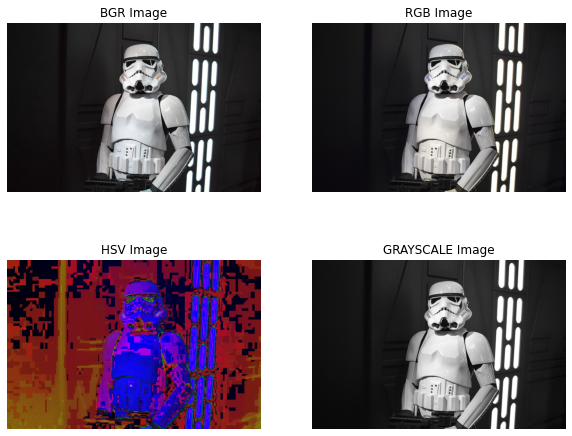

In [9]:
plt.figure(figsize= (10,8))
plt.subplot(2,2,1), plt.imshow(bgr_image), plt.title("BGR Image"), plt.axis("off");
plt.subplot(2,2,2), plt.imshow(rgb_image), plt.title("RGB Image"), plt.axis("off");
plt.subplot(2,2,3), plt.imshow(hsv_image), plt.title("HSV Image"), plt.axis("off");
plt.subplot(2,2,4), plt.imshow(grayscale_image, cmap= "gray"), plt.title("GRAYSCALE Image"), plt.axis("off");

RGB, BGR and Grayscale images look alike as the pixels in the image are almost equal for each channel (r-g-b)

In [10]:
redChannelAverage= rgb_image[:,:,0].mean()
greenChannelAverage= rgb_image[:,:,1].mean()
blueChannelAverage= rgb_image[:,:,2].mean()
print("Red Channel Average: {}\nGreen Channel Average: {}\nBlue Channel Average: {}".\
     format(redChannelAverage, greenChannelAverage, blueChannelAverage))

Red Channel Average: 67.86524354460094
Green Channel Average: 66.91350132042254
Blue Channel Average: 67.58848298122065


<a id = "3"></a><br>
# Create Histogram

* Histogram shows how many which pixel value is in the image

In [11]:
img= cv2.imread("C:\\Users\Kadir KAYA\\Desktop\\Github\\Basic OpenCV Tutorial\\Images\\balls.jpg")

So now we use cv2.calcHist() function to find the histogram. Let's familiarize with the function and its parameters :

cv2.calcHist(images, channels, mask, histSize, ranges, hist, accumulate)

* images : it is the source image of type uint8 or float32. it should be given in square brackets, ie, "[img]".
* channels : it is also given in square brackets. It is the index of channel for which we calculate histogram. For example, if input is grayscale image, its value is [0]. For color image, you can pass [0], [1] or [2] to calculate histogram of blue, green or red channel respectively.
* mask : mask image. To find histogram of full image, it is given as "None". But if you want to find histogram of particular region of image, you have to create a mask image for that and give it as mask.
* histSize : this represents our BIN count. Need to be given in square brackets. For full scale, we pass [256].
* ranges : this is our RANGE. Normally, it is [0,256].

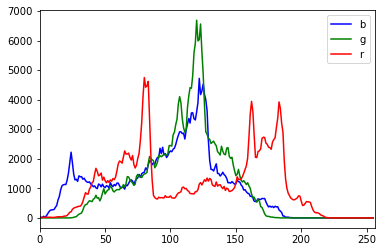

In [12]:
# Calculate Histogram using OpenCV
color = ('b','g','r')
for i,col in enumerate(color):
    histr = cv2.calcHist([img], channels= [i], mask= None, histSize= [256], ranges= [0,256])
    plt.plot(histr,color = col, label= col)
    plt.legend()
    plt.xlim([0,256])
plt.show()

or we can use it like this

In [13]:
b= cv2.calcHist([img], channels= [0], mask= None, histSize= [256], ranges= [0,256])
g= cv2.calcHist([img], channels= [1], mask= None, histSize= [256], ranges= [0,256])
r= cv2.calcHist([img], channels= [2], mask= None, histSize= [256], ranges= [0,256])

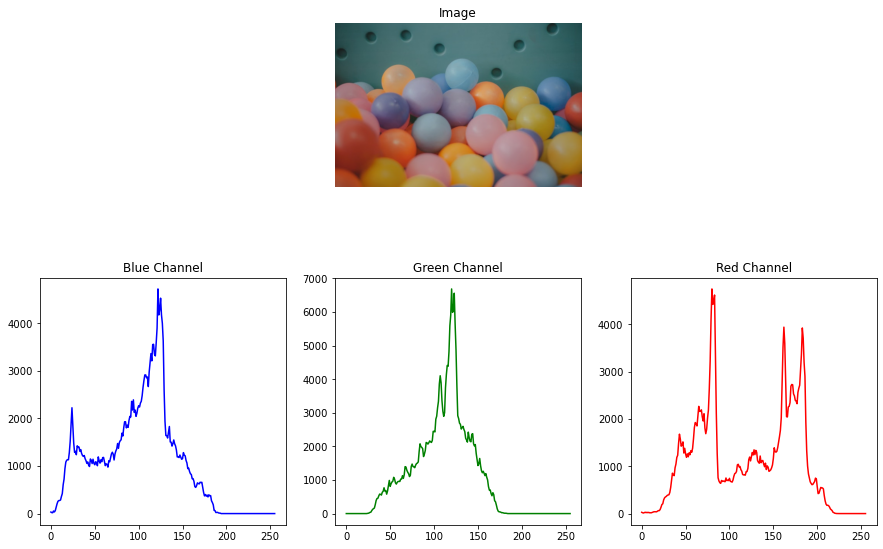

In [14]:
plt.figure(figsize= (15,10))
plt.subplot(232), plt.imshow(img[:,:,[2,1,0]]), plt.axis("off"), plt.title("Image")
plt.subplot(234), plt.plot(b, color= "b"), plt.title("Blue Channel")
plt.subplot(235), plt.plot(g, color= "g"), plt.title("Green Channel")
plt.subplot(236), plt.plot(r, color= "r"), plt.title("Red Channel")
plt.show()

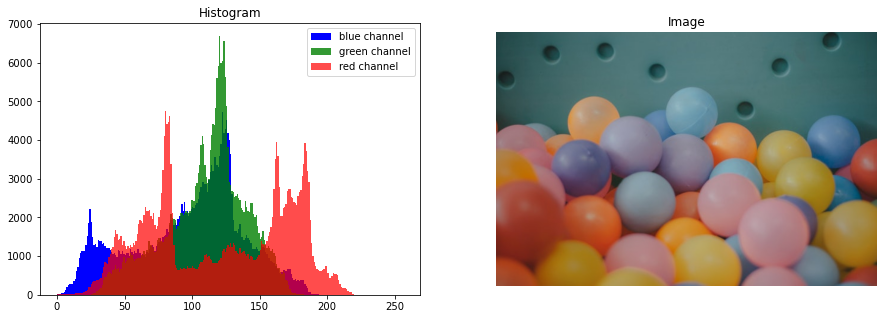

In [15]:
# another histogram visualization method
plt.figure(figsize= (15,5))
plt.subplot(121)
plt.hist(img[:,:,0].ravel(), bins= 256, range= [0,256], label= "blue channel", color= "b", alpha= 1)
plt.hist(img[:,:,1].ravel(), bins= 256, range= [0,256], label= "green channel", color= "g", alpha= .8)
plt.hist(img[:,:,2].ravel(), bins= 256, range= [0,256], label= "red channel", color= "r", alpha= .7)
plt.legend()
plt.title("Histogram")
plt.subplot(122), plt.imshow(img[:,:,[2,1,0]]), plt.title("Image"), plt.axis("off")
plt.show()

<a id = "4"></a><br>
# Histogram Equalization

* If the histogram of an image is stacked to a certain range , histogram equalization method allows the image contrast to open by expanding this range.

In [16]:
image= cv2.imread("C:\\Users\Kadir KAYA\\Desktop\\Github\\Basic OpenCV Tutorial\\Images\\clahe.jpg", 0)

In [17]:
equalizeImage= cv2.equalizeHist(image)

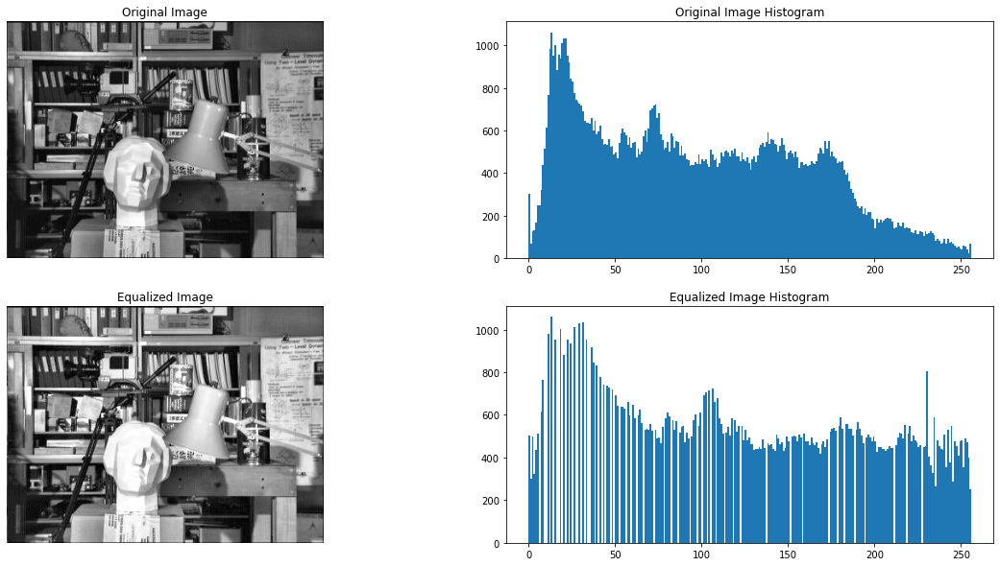

In [18]:
plt.figure(figsize= (20,10))
plt.subplot(221), plt.imshow(image, cmap= "gray"), plt.title("Original Image"), plt.axis("off")
plt.subplot(222), plt.hist(image.flatten(),256,[0,256]), plt.title("Original Image Histogram")
plt.subplot(223), plt.imshow(equalizeImage, cmap= "gray"), plt.title("Equalized Image"), plt.axis("off")
plt.subplot(224), plt.hist(equalizeImage.flatten(),256,[0,256]), plt.title("Equalized Image Histogram")
plt.show()

<a id = "5"></a><br>
## Adaptive Histogram Equalization

In [19]:
adaptEqualImage= cv2.createCLAHE().apply(image)

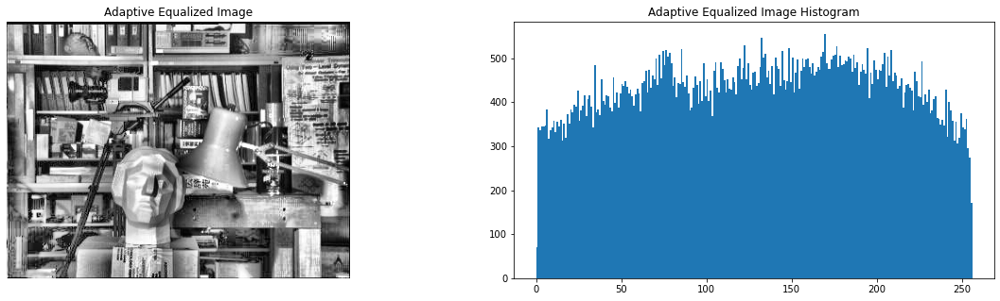

In [20]:
plt.figure(figsize= (20,5))
plt.subplot(121), plt.imshow(adaptEqualImage, cmap= "gray"), plt.title("Adaptive Equalized Image"), plt.axis("off")
plt.subplot(122), plt.hist(adaptEqualImage.flatten(),256,[0,256]), plt.title("Adaptive Equalized Image Histogram")
plt.show()

<a id = "6"></a><br>
# Thresholding

* We use thresholding to convert images to binary, making it easier to manipulate images.
* We set a threshold and pixels below this threshold will be 0 (black), pixels above this threshold will be 1 (white).
* The image should be grayscale to make a meaningful thresholding.

In [21]:
gray_image= cv2.imread("C:\\Users\Kadir KAYA\\Desktop\\Github\\Basic OpenCV Tutorial\\Images\\map.jpg", 0)
thresh, binary_image= cv2.threshold(gray_image, thresh= 20, maxval= 255, type= cv2.THRESH_BINARY)

The cv2.threshold method returns two values :
* First Value: thresh
* Second Value: Threshold Image

In [22]:
print("Used Threshold Value: ", thresh)

Used Threshold Value:  20.0


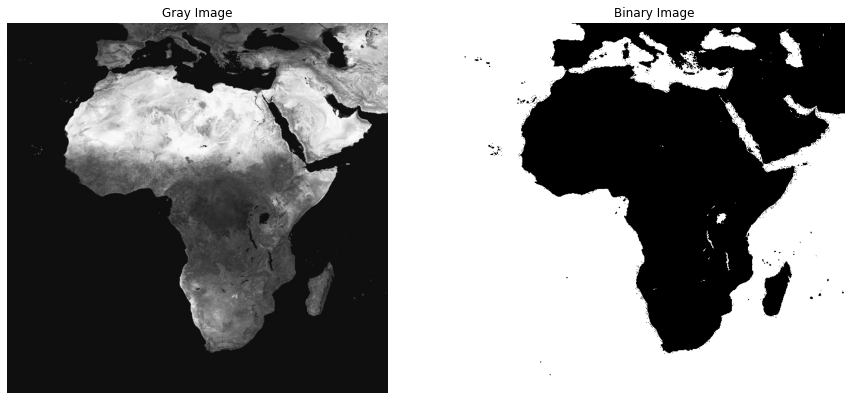

In [23]:
plt.figure(figsize= (15,10))
plt.subplot(1,2,1), plt.imshow(gray_image, cmap= "gray"), plt.title("Gray Image"), plt.axis("off")
plt.subplot(1,2,2), plt.imshow(binary_image, cmap= "binary"), plt.title("Binary Image"), plt.axis("off")
plt.show()

In [24]:
_, inv_bw= cv2.threshold(gray_image, 20, 255, cv2.THRESH_BINARY_INV)
_, tozero_bw= cv2.threshold(gray_image,20,255,cv2.THRESH_TOZERO)
_, triangle_bw= cv2.threshold(gray_image,20,255,cv2.THRESH_TRIANGLE)
_, trunc_bw= cv2.threshold(gray_image,20,255,cv2.THRESH_TRUNC)
_, otsu_bw= cv2.threshold(gray_image,0,255,cv2.THRESH_TRUNC + cv2.THRESH_OTSU)
adapt_bw= cv2.adaptiveThreshold(gray_image, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 11,2)

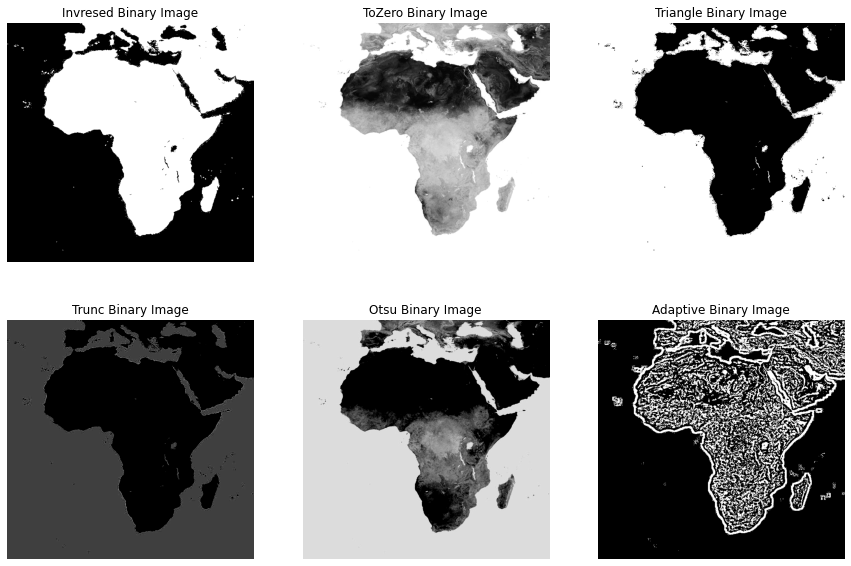

In [25]:
plt.figure(figsize= (15,10))
plt.subplot(231), plt.imshow(inv_bw, cmap= "binary"), plt.title("Invresed Binary Image"), plt.axis("off")
plt.subplot(232), plt.imshow(tozero_bw, cmap= "binary"), plt.title("ToZero Binary Image"), plt.axis("off")
plt.subplot(233), plt.imshow(triangle_bw, cmap= "binary"), plt.title("Triangle Binary Image"), plt.axis("off")
plt.subplot(234), plt.imshow(trunc_bw, cmap= "binary"), plt.title("Trunc Binary Image"), plt.axis("off")
plt.subplot(235), plt.imshow(otsu_bw, cmap= "binary"), plt.title("Otsu Binary Image"), plt.axis("off")
plt.subplot(236), plt.imshow(adapt_bw, cmap= "binary"), plt.title("Adaptive Binary Image"), plt.axis("off")
plt.show()

* The purpose of thresholding is to obtain a binary image that can represent the object on the image. So we need to chose the optimum threshold value.


* A threshold value can be chosen instinctively or using a histogram graph.


* The OTSU method calculates the threshold value itself. This method is not useful for multicolor and single color images. It works well on images where the histogram graph peaks at 2 points.


* Adaptive thresholding method can give good results then other methods.

In [26]:
bookpage= cv2.imread("C:\\Users\Kadir KAYA\\Desktop\\Github\\Basic OpenCV Tutorial\\Images\\bookpage.jpg", 0)

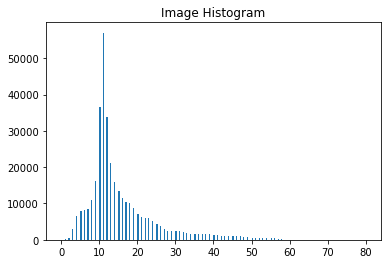

In [27]:
plt.hist(bookpage.flatten(), 256, [0,80]), plt.title("Image Histogram")
plt.show()

In [28]:
value_counts= np.asarray(np.unique(bookpage, return_counts=True)).T

most_val= value_counts[value_counts[:,1]== value_counts.max()][0,0]
count= value_counts[value_counts[:,1]== value_counts.max()][0,1]

print("Most Value: {}\nCount: {}".format(most_val, count))

Most Value: 11
Count: 57041


The histogram appears to peak at 11. We can choose the threshold value less than 11 by looking at the histogram .

In [29]:
_, bw_bookpage= cv2.threshold(bookpage, 10, 255, cv2.THRESH_BINARY)
_, otsu_bookpage= cv2.threshold(bookpage, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
adapt_bookpage= cv2.adaptiveThreshold(bookpage, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)

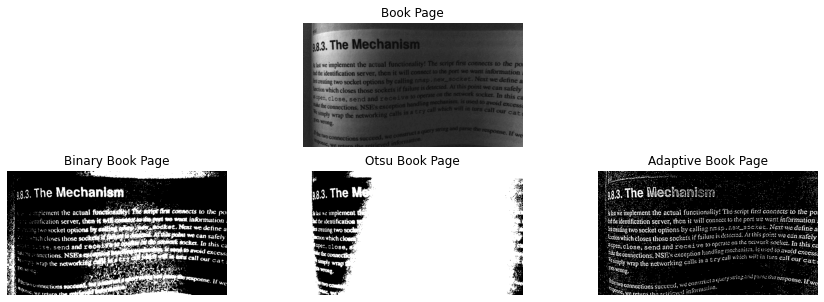

In [30]:
plt.figure(figsize= (15,5))
plt.subplot(232), plt.imshow(bookpage, cmap= "gray"), plt.title("Book Page"), plt.axis("off")

plt.subplot(234), plt.imshow(bw_bookpage, cmap= "binary"), plt.title("Binary Book Page"), plt.axis("off")
plt.subplot(235), plt.imshow(otsu_bookpage, cmap= "binary"), plt.title("Otsu Book Page"), plt.axis("off")
plt.subplot(236), plt.imshow(adapt_bookpage, cmap= "binary"), plt.title("Adaptive Book Page"), plt.axis("off")
plt.show()

<a id = "7"></a><br>
# Image Resizing

In [31]:
drone= cv2.imread("...\\Github\\Basic OpenCV Tutorial\\Images\\drone.jpg")

In [32]:
print("Image Shape: ", drone.shape)

Image Shape:  (800, 1200, 3)


In [33]:
cv2.imshow("Drone", drone)
cv2.waitKey(0)
cv2.destroyAllWindows()

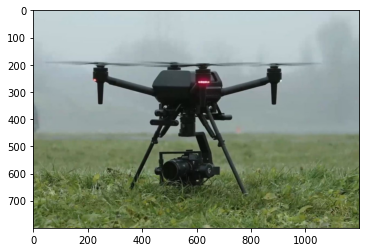

In [34]:
plt.imshow(drone[:,:,[2,1,0]]);

In [35]:
column, row = (640,480)
resized_drone= cv2.resize(drone, (column, # x-axis
                                  row # y-axis
                                 ))

In [36]:
print("Resized Image Shape: ", resized_drone.shape)

Resized Image Shape:  (480, 640, 3)


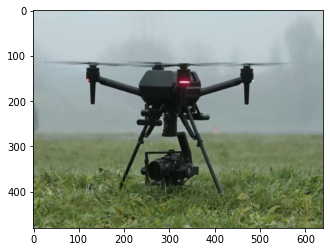

In [37]:
plt.imshow(resized_drone[:,:,[2,1,0]]);

We can resize with aspect ratio to prevent distortions in the image.

In [38]:
def resizeWithAspectRatio(img, width= None, height= None, inter= cv2.INTER_AREA):
    
    dimension= None
    (h,w)= img.shape[:2]
    
    if width is None and height is None: 
        return img
    
    elif width is None:
        r= height/float(h)
        dimension= (int(w*r), height)
        
    else:
        r= width/ float(w)
        dimension= (width, int(h*r))
        
    return cv2.resize(img, dimension, interpolation= inter)

In [39]:
resized_drone2= resizeWithAspectRatio(drone, width= 640, height= None, inter= cv2.INTER_AREA)

cv2.imshow("Original", drone)
cv2.imshow("Resized", resized_drone)
cv2.imshow("Resized with Aspect Ratio", resized_drone2)

cv2.waitKey(0)
cv2.destroyAllWindows()

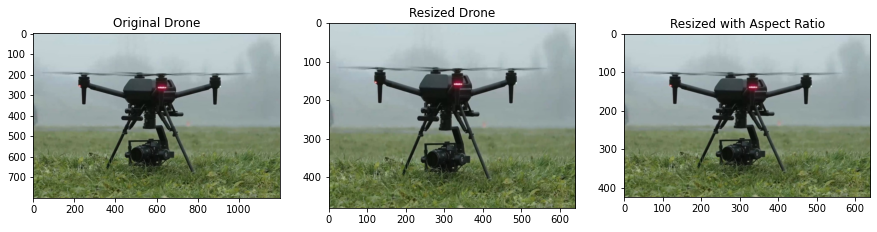

In [40]:
plt.figure(figsize= (15,15))
plt.subplot(131), plt.imshow(drone[:,:,[2,1,0]]), plt.title("Original Drone")
plt.subplot(132), plt.imshow(resized_drone[:,:,[2,1,0]]), plt.title("Resized Drone")
plt.subplot(133), plt.imshow(resized_drone2[:,:,[2,1,0]]), plt.title("Resized with Aspect Ratio")
plt.show()

In [41]:
print("Original Image Shape: {}\nResized Image Shape: {}\nResized with Aspect Ratio Image Shape: {}".\
     format(drone.shape, resized_drone.shape, resized_drone2.shape))

Original Image Shape: (800, 1200, 3)
Resized Image Shape: (480, 640, 3)
Resized with Aspect Ratio Image Shape: (426, 640, 3)


<a id = "8"></a><br>
# Drawing and Writing in Images

In [42]:
canvas = np.zeros((512,512,3), np.uint8)

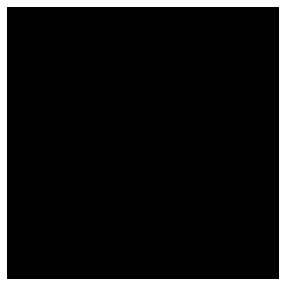

In [43]:
plt.figure(figsize= (5,5)), plt.imshow(canvas), plt.axis("off");

In [44]:
# add line
cv2.line(canvas, pt1= (50,50), # start point
                 pt2= (450,450), # end point
                 color= (0,0,255), # (red (0-255), green (0-255), blue (0-255))
                 thickness= 3, lineType= cv2.LINE_AA);

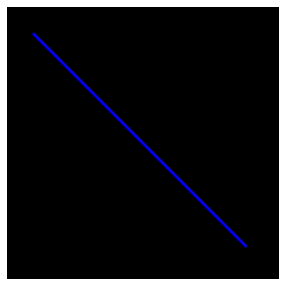

In [45]:
plt.figure(figsize= (5,5)), plt.imshow(canvas), plt.axis("off");

In [46]:
#add rectangle
cv2.rectangle(canvas, (10,10), (100,100), (0,255,0), -1); # when the thickness is -1, the shape is filled in
cv2.rectangle(canvas, (100,100), (200,200), (0,255,0), 3);

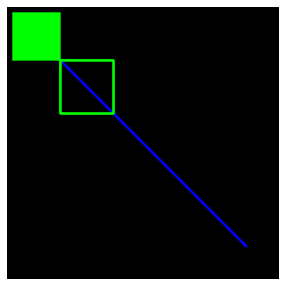

In [47]:
plt.figure(figsize= (5,5)), plt.imshow(canvas), plt.axis("off");

In [48]:
# add circle
cv2.circle(canvas, center= (256,256), radius= 80, color= (255,0,0), thickness= -1);

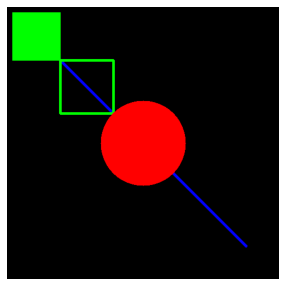

In [49]:
plt.figure(figsize= (5,5)), plt.imshow(canvas), plt.axis("off");

In [50]:
# put text 
cv2.putText(canvas, text= "Text", org= (350,50), 
            fontFace= cv2.FONT_HERSHEY_SIMPLEX, 
            fontScale= 2, color= (255,255,255),
            thickness= 2);

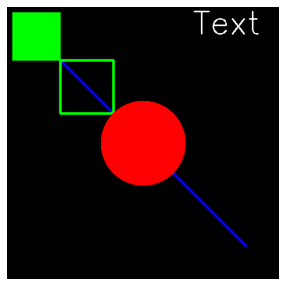

In [51]:
plt.figure(figsize= (5,5)), plt.imshow(canvas), plt.axis("off");

<a id = "9"></a><br>
# Arithmetic Operations on Images

* Learn several arithmetic operations on images, like addition, subtraction, bitwise operations, and etc.


<a id = "10"></a><br>
## Image Addition

You can add two images with the OpenCV function, cv2.add(), or simply by the numpy operation res = img1 + img2. Both images should be of same depth and type, or the second image can just be a scalar value.

In [52]:
x = np.uint8([250])
y = np.uint8([10])
print( cv2.add(x,y))  # 250+10 = 260 => 255
print( x+y )          # 250+10 = 260 % 256 = 4

[[255]]
[4]


In [53]:
circle= np.zeros((512,512,3), np.uint8) + 255
cv2.circle(circle,(256,256), 60, (0,0,255), -1)

rectangle= np.full((512,512,3), 255, np.uint8)
cv2.rectangle(rectangle, (150,150), (300,300), (255,0,0), -1)

add= cv2.add(rectangle, circle)

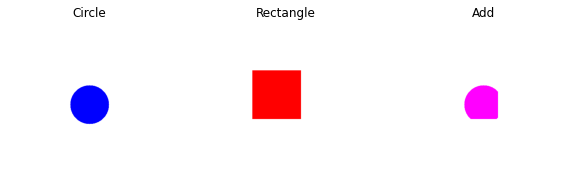

In [54]:
plt.figure(figsize= (10,10))
plt.subplot(131), plt.imshow(circle), plt.axis("off"), plt.title("Circle")
plt.subplot(132), plt.imshow(rectangle), plt.axis("off"), plt.title("Rectangle")
plt.subplot(133), plt.imshow(add), plt.axis("off"), plt.title("Add")
plt.show()

<a id = "11"></a><br>
## Image Blending
This is also image addition, but different weights are given to images in order to give a feeling of blending or transparency. Images are added as per the equation below:
* g(x)=(1−α)f0(x)+αf1(x)

By varying α from 0→1, you can perform a cool transition between one image to another.

Here I took two images to blend together. The first image is given a weight of 0.7 and the second image is given 0.3. cv2.addWeighted() applies the following equation to the image:
* dst=α⋅img1+β⋅img2+γ

Here γ is taken as zero.

In [55]:
img1= cv2.imread("...\\Github\\Basic OpenCV Tutorial\\Images\\shen.jpg")
img2= cv2.imread("...\\Github\\Basic OpenCV Tutorial\\Images\\opencv.png")
img2= cv2.resize(img2, (img1.shape[:2][::-1]))
dst = cv2.addWeighted(src1= img1, alpha= 0.7, src2= img2, beta= 0.3, gamma= 0)

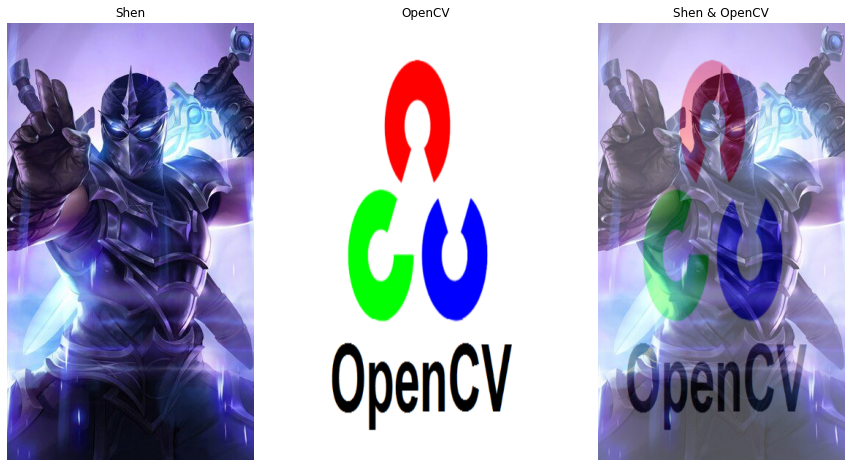

In [56]:
plt.figure(figsize= (15,10))
plt.subplot(131), plt.imshow(img1[:,:,[2,1,0]]), plt.axis("off"), plt.title("Shen")
plt.subplot(132), plt.imshow(img2[:,:,[2,1,0]]), plt.axis("off"), plt.title("OpenCV")
plt.subplot(133), plt.imshow(dst[:,:,[2,1,0]]), plt.axis("off"), plt.title("Shen & OpenCV")
plt.show()

<a id = "12"></a><br>
## Bitwise Operations
This includes the bitwise AND, OR, NOT, and XOR operations. They will be highly useful while extracting any part of the image, defining and working with non-rectangular ROI's, and etc. Below we will see an example of how to change a particular region of an image.

I want to put the OpenCV logo above an image. If I add two images, it will change the color. If I blend them, I get a transparent effect. But I want it to be opaque. If it was a rectangular region, I could use ROI. But the OpenCV logo is a not a rectangular shape. So you can do it with bitwise operations as shown below.

In [57]:
# Load two images
img1 = cv2.imread("...\\Github\\Basic OpenCV Tutorial\\Images\\rocket-racoon.jpg")
img2= cv2.imread("...\\Github\\Basic OpenCV Tutorial\\Images\\opencv.png")

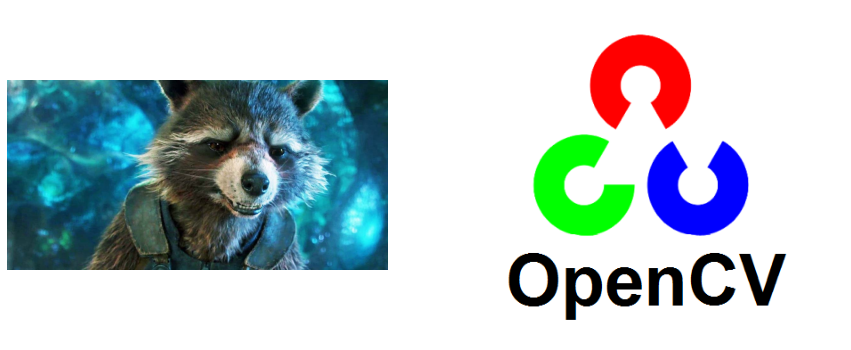

In [58]:
plt.figure(figsize= (15,10))
plt.subplot(121), plt.imshow(img1[:,:,[2,1,0]]), plt.axis("off")
plt.subplot(122), plt.imshow(img2[:,:,[2,1,0]]), plt.axis("off")
plt.show()

In [59]:
# I want to put logo on top-left corner, So I create a ROI
rows,cols,channels = img2.shape
roi = img1[0:rows, 0:cols]

In [60]:
# Now create a mask of logo and create its inverse mask also
img2gray = cv2.cvtColor(img2,cv2.COLOR_BGR2GRAY)
ret, mask = cv2.threshold(img2gray, 150, 255, cv2.THRESH_BINARY_INV)
mask_inv = cv2.bitwise_not(mask)

In [61]:
# Now black-out the area of logo in ROI
img1_bg = cv2.bitwise_and(src1= roi, src2= roi, mask = mask_inv)

In [62]:
# Take only region of logo from logo image.
img2_fg = cv2.bitwise_and(img2, img2, mask = mask)

In [63]:
# Put logo in ROI and modify the main image
dst = cv2.add(img1_bg,img2_fg)
img1[0:rows, 0:cols ] = dst

In [64]:
cv2.imshow('Result',img1)
cv2.waitKey(0)
cv2.destroyAllWindows()

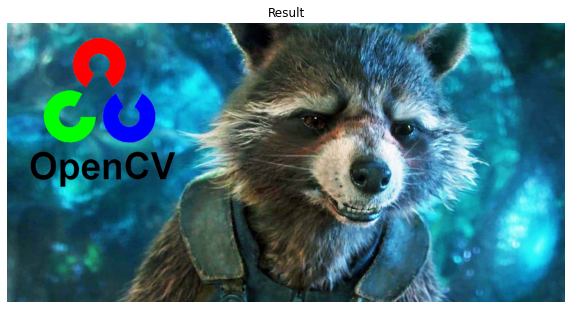

In [65]:
plt.figure(figsize= (10,8))
plt.imshow(img1[:,:,[2,1,0]]), plt.axis("off"), plt.title("Result");

<a id = "13"></a><br>
# Morphological Transformations
Morphological transformations are some simple operations based on the image shape. It is normally performed on binary images. It needs two inputs, one is our original image, second one is called structuring element or kernel which decides the nature of operation. Two basic morphological operators are Erosion and Dilation. Then its variant forms like Opening, Closing, Gradient etc also comes into play.

In [66]:
img= cv2.imread("...\\Github\\Basic OpenCV Tutorial\\Images\\j.png", 0)

In [67]:
kernel = np.ones((5,5),np.uint8)

<a id = "14"></a><br>
## 1. Erosion
The basic idea of erosion is just like soil erosion only, it erodes away the boundaries of foreground object (Always try to keep foreground in white). So what it does? The kernel slides through the image. A pixel in the original image (either 1 or 0) will be considered 1 only if all the pixels under the kernel is 1, otherwise it is eroded (made to zero).

So what happends is that, all the pixels near boundary will be discarded depending upon the size of kernel. So the thickness or size of the foreground object decreases or simply white region decreases in the image. It is useful for removing small white noises, detach two connected objects etc.

Here, as an example, I would use a 5x5 kernel with full of ones. Let's see it how it works:

In [68]:
erosion = cv2.erode(img,kernel,iterations = 1)

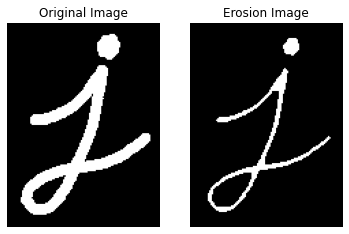

In [69]:
plt.subplot(121), plt.imshow(img, cmap= "gray"), plt.title("Original Image"), plt.axis("off")
plt.subplot(122), plt.imshow(erosion, cmap= "gray"), plt.title("Erosion Image"), plt.axis("off")
plt.show()

<a id = "15"></a><br>
## 2. Dilation
It is just opposite of erosion. Here, a pixel element is '1' if atleast one pixel under the kernel is '1'. So it increases the white region in the image or size of foreground object increases. Normally, in cases like noise removal, erosion is followed by dilation. Because, erosion removes white noises, but it also shrinks our object. So we dilate it. Since noise is gone, they won't come back, but our object area increases. It is also useful in joining broken parts of an object.

In [70]:
dilation= cv2.dilate(img, kernel, iterations= 1)

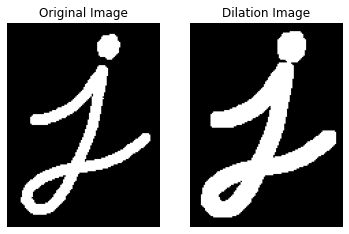

In [71]:
plt.subplot(121), plt.imshow(img, cmap= "gray"), plt.title("Original Image"), plt.axis("off")
plt.subplot(122), plt.imshow(dilation, cmap= "gray"), plt.title("Dilation Image"), plt.axis("off")
plt.show()

<a id = "16"></a><br>
## 3. Opening
Opening is just another name of erosion followed by dilation. It is useful in removing noise, as we explained above.

In [72]:
rand= np.random.randint(0,2,img.shape, np.uint8)*255

In [73]:
noise_img= cv2.addWeighted(src1= img, alpha= 1, src2= rand, beta= 1, gamma= 0)

In [74]:
opening = cv2.morphologyEx(noise_img, cv2.MORPH_OPEN, kernel)

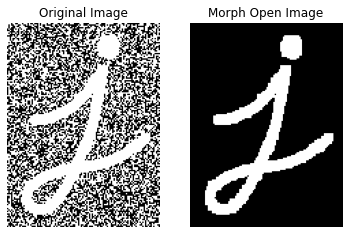

In [75]:
plt.subplot(121), plt.imshow(noise_img, cmap= "gray"), plt.title("Original Image"), plt.axis("off")
plt.subplot(122), plt.imshow(opening, cmap= "gray"), plt.title("Morph Open Image"), plt.axis("off")
plt.show()

<a id = "17"></a><br>
## 4. Closing
Closing is reverse of Opening, Dilation followed by Erosion. It is useful in closing small holes inside the foreground objects, or small black points on the object.

In [76]:
closing = cv2.morphologyEx(~noise_img, cv2.MORPH_CLOSE, kernel)

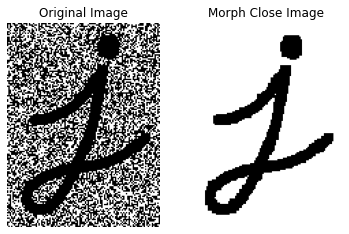

In [77]:
plt.subplot(121), plt.imshow(~noise_img, cmap= "gray"), plt.title("Original Image"), plt.axis("off")
plt.subplot(122), plt.imshow(closing, cmap= "gray"), plt.title("Morph Close Image"), plt.axis("off")
plt.show()

<a id = "18"></a><br>
## 5. Morphological Gradient
It is the difference between dilation and erosion of an image.

The result will look like the outline of the object.

In [78]:
gradient = cv2.morphologyEx(img, cv2.MORPH_GRADIENT, kernel)

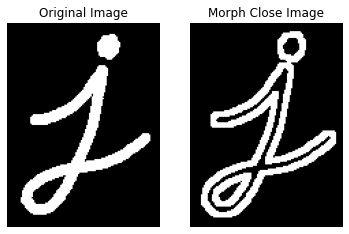

In [79]:
plt.subplot(121), plt.imshow(img, cmap= "gray"), plt.title("Original Image"), plt.axis("off")
plt.subplot(122), plt.imshow(gradient, cmap= "gray"), plt.title("Morph Close Image"), plt.axis("off")
plt.show()

<a id = "19"></a><br>
## Structuring Element
We manually created a structuring elements in the previous examples with help of Numpy. It is rectangular shape. But in some cases, you may need elliptical/circular shaped kernels. So for this purpose, OpenCV has a function, cv2.getStructuringElement(). You just pass the shape and size of the kernel, you get the desired kernel.

[[1 1 1 1 1]
 [1 1 1 1 1]
 [1 1 1 1 1]
 [1 1 1 1 1]
 [1 1 1 1 1]]


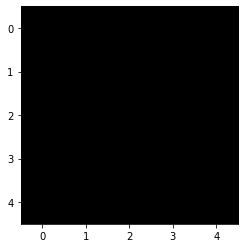

In [80]:
# Rectangular Kernel
rectangular_kernel= cv2.getStructuringElement(cv2.MORPH_RECT,(5,5))
print(rectangular_kernel)
plt.imshow(rectangular_kernel, cmap= "gray");

[[0 0 1 0 0]
 [1 1 1 1 1]
 [1 1 1 1 1]
 [1 1 1 1 1]
 [0 0 1 0 0]]


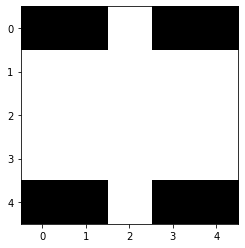

In [81]:
# Elliptical Kernel
elliptical_kernel= cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(5,5))
print(elliptical_kernel)
plt.imshow(elliptical_kernel, cmap= "gray");

[[0 0 1 0 0]
 [0 0 1 0 0]
 [1 1 1 1 1]
 [0 0 1 0 0]
 [0 0 1 0 0]]


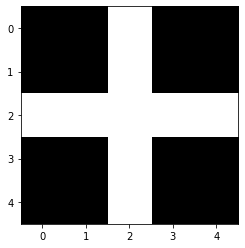

In [82]:
# Cross-shaped Kernel
cross_kernel= cv2.getStructuringElement(cv2.MORPH_CROSS,(5,5))
print(cross_kernel)
plt.imshow(cross_kernel, cmap= "gray");

<a id = "20"></a><br>
# Image Smoothing

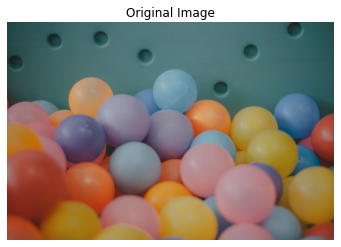

In [83]:
img= cv2.imread("...\\Github\\Basic OpenCV Tutorial\\Images\\balls.jpg")
img= cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img), plt.title("Original Image"), plt.axis("off")
plt.show()

In [84]:
def gaussianNoise(img):
    
    row, col, ch= img.shape
    mean= 0
    var= .05
    sigma= var**.5
    
    gauss= np.random.normal(mean, sigma, (row, col, ch))
    noisy= img + gauss
    
    return noisy

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


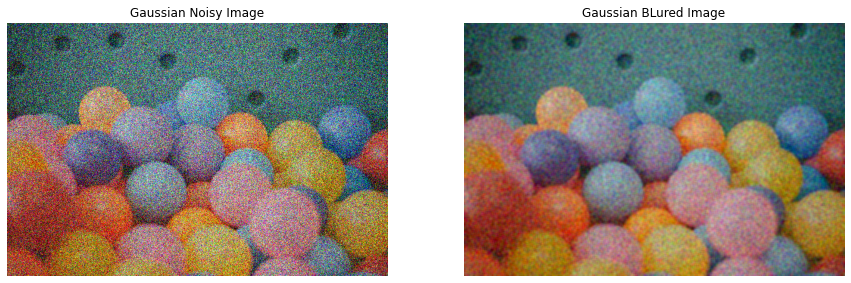

In [85]:
gaussianNoisyImage= gaussianNoise(img/255)
gb= cv2.GaussianBlur(gaussianNoisyImage, ksize= (5,5), sigmaX= 7)

plt.figure(figsize= (15,15))
plt.subplot(121), plt.imshow(gaussianNoisyImage), plt.title("Gaussian Noisy Image"), plt.axis("off")
plt.subplot(122), plt.imshow(gb), plt.title("Gaussian BLured Image"), plt.axis("off")
plt.show()

The noises have been cleared, but still the images look distorted.

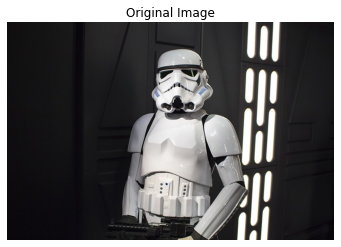

In [86]:
img2= cv2.imread("...\\Github\\Basic OpenCV Tutorial\\Images\\starwars.jpg")
img2= cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)
plt.imshow(img2), plt.title("Original Image"), plt.axis("off"),
plt.show()

In [87]:
def saltPepperNoise(img):
    
    row, col, ch= img.shape
    
    s_vs_p= .5
    amount= .01
    noisy= img.copy()

    # salt -white- noise
    num_salt= np.ceil(amount*img.size*s_vs_p)
    coords= [np.random.randint(0, i-1, int(num_salt)) for i in img.shape]
    noisy[coords]= 1

    # pepper -black- noise
    num_pepper= np.ceil(amount*img.size*(1- s_vs_p))
    coords= [np.random.randint(0, i-1, int(num_pepper)) for i in img.shape]
    noisy[coords]= 0

    return noisy

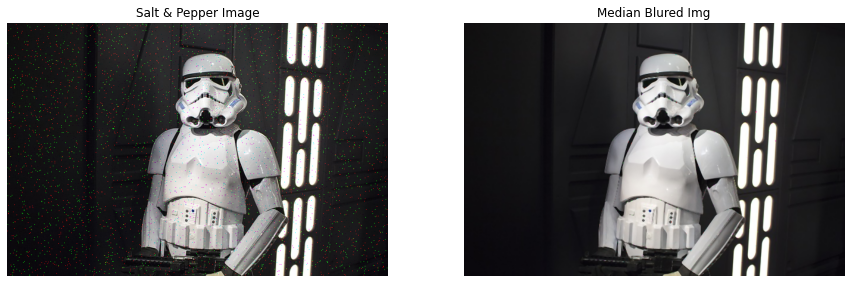

In [88]:
spImage= saltPepperNoise(img2/255)

mb= cv2.medianBlur(spImage.astype(np.float32), ksize= 3)

plt.figure(figsize= (15,15))
plt.subplot(121), plt.imshow(spImage), plt.title("Salt & Pepper Image"), plt.axis("off")
plt.subplot(122), plt.imshow(mb), plt.title("Median Blured Img"), plt.axis("off")
plt.show()

It is seen that the image is successfully cleaned of the noises and does not deteriorate much.

In [89]:
blur= cv2.blur(img, ksize= (10,10))
blur_g= cv2.GaussianBlur(img, ksize= (5,5), sigmaX= 7, sigmaY= 7, borderType= cv2.BORDER_DEFAULT)
blur_m= cv2.medianBlur(img, ksize= 5)
blur_b= cv2.bilateralFilter(img, d= 20, sigmaColor= 100, sigmaSpace= 100)

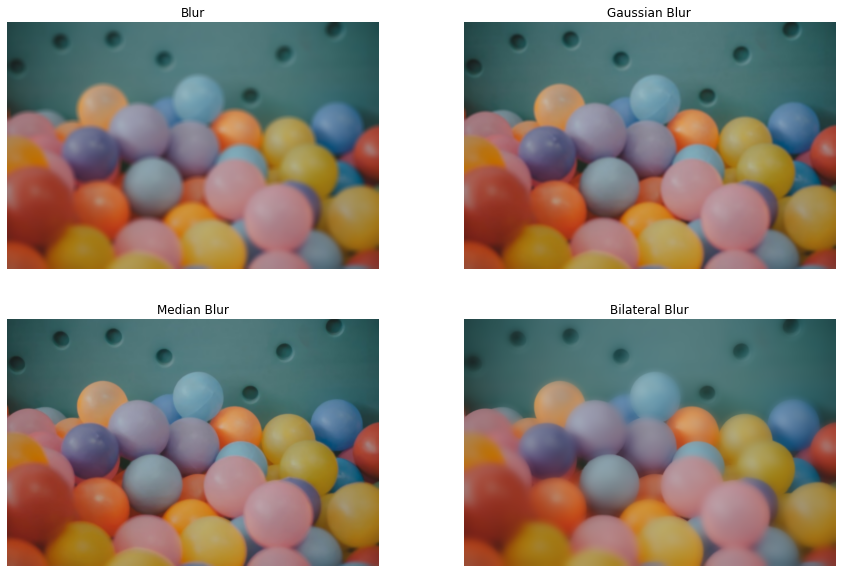

In [90]:
plt.figure(figsize= (15,10))
plt.subplot(221), plt.imshow(blur), plt.axis("off"), plt.title("Blur")
plt.subplot(222), plt.imshow(blur_g), plt.axis("off"), plt.title("Gaussian Blur")
plt.subplot(223), plt.imshow(blur_m), plt.axis("off"), plt.title("Median Blur")
plt.subplot(224), plt.imshow(blur_b), plt.axis("off"), plt.title("Bilateral Blur")
plt.show()

<a id = "21"></a><br>
# Perspective Warping

For perspective transformation, you need a 3x3 transformation matrix. Straight lines will remain straight even after the transformation. To find this transformation matrix, you need 4 points on the input image and corresponding points on the output image. Among these 4 points, 3 of them should not be collinear. Then the transformation matrix can be found by the function cv2.getPerspectiveTransform. Then apply cv2.warpPerspective with this 3x3 transformation matrix.

cv2.getPerspectiveTransform(src, dst, solveMethod) --> Calculates a perspective transform from four pairs of the corresponding points.

* src: Coordinates of quadrangle vertices in the source image.
* dst: Coordinates of the corresponding quadrangle vertices in the destination image.

cv2.warpPerspective(src, M, dsize, dst, flags, borderMode, borderValue) -->Applies a perspective transformation to an image.

* src: input image.
* M: transformation matrix.
* dsize: size of the output image.
* dst: output image that has the size dsize and the same type as src.
* flags: combination of interpolation methods (#INTER_LINEAR or #INTER_NEAREST) and the optional flag #WARP_INVERSE_MAP, that sets M as the inverse transformation
* borderMode: pixel extrapolation method (#BORDER_CONSTANT or #BORDER_REPLICATE).
* borderValue: value used in case of a constant border; by default, it equals 0.

In [91]:
perspective= cv2.imread("...\\Github\\Basic OpenCV Tutorial\\Images\\perspective.png")
perspective= cv2.cvtColor(perspective, cv2.COLOR_BGR2RGB)

h,w,_= perspective.shape

pts1= np.float32([[30,140], [100,270], [215,60], [290,155]])
pts2= np.float32([[0,0], [0,h], [w,0], [h,w]])

matrix= cv2.getPerspectiveTransform(pts1,pts2)
print("Transformation Matrix \n", matrix)

imgOutput= cv2.warpPerspective(perspective, matrix, (w,h))

Transformation Matrix 
 [[ 1.28047399e+00 -6.89485997e-01  5.81138198e+01]
 [ 1.02831165e+00  2.37797068e+00 -3.63765245e+02]
 [-4.78982553e-04  7.51115916e-04  1.00000000e+00]]


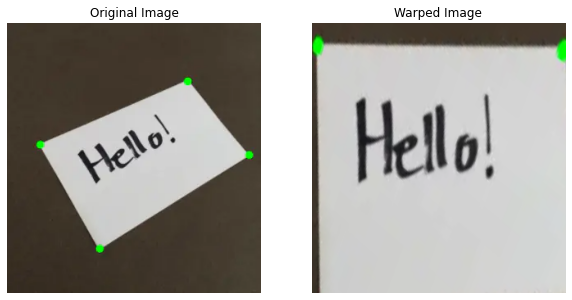

In [92]:
plt.figure(figsize= (10,10))
plt.subplot(121), plt.imshow(perspective), plt.axis("off"), plt.title("Original Image")
plt.subplot(122), plt.imshow(imgOutput), plt.axis("off"), plt.title("Warped Image")

plt.show()

<a id = "22"></a><br>
# Shifting and Rotation

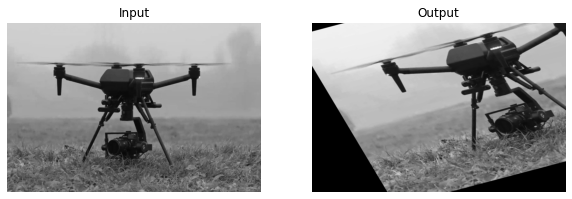

In [93]:
img= cv2.imread("...\\Github\\Basic OpenCV Tutorial\\Images\\drone.jpg", 0)

rows,cols = img.shape

pts1 = np.float32([[50,50],[200,50],[50,200]])
pts2 = np.float32([[10,100],[200,50],[100,250]])

M = cv2.getAffineTransform(pts1,pts2)
dst = cv2.warpAffine(img,M,(cols,rows))

plt.figure(figsize= (10,5))
plt.subplot(121),plt.imshow(img, cmap= "gray"),plt.title('Input'), plt.axis("off")
plt.subplot(122),plt.imshow(dst, cmap= "gray"),plt.title('Output'), plt.axis("off")
plt.show()

In [94]:
M1= np.float32([[1,0,28], [0,1,56]])
M2=  np.float32([[0,1,28], [1,0,56]])

dst= cv2.warpAffine(img, M1, dsize= (700,700))
dst2= cv2.warpAffine(img, M2, dsize= (700,700))

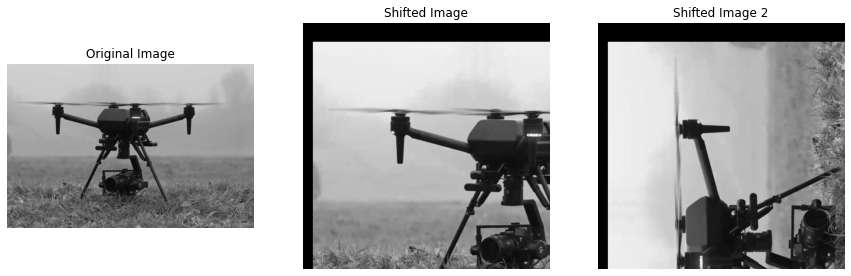

In [95]:
plt.figure(figsize= (15,10))
plt.subplot(131), plt.imshow(img, cmap= "gray"), plt.axis("off"), plt.title("Original Image")
plt.subplot(132), plt.imshow(dst, cmap= "gray"), plt.axis("off"), plt.title("Shifted Image")
plt.subplot(133), plt.imshow(dst2, cmap= "gray"), plt.axis("off"), plt.title("Shifted Image 2")
plt.show()

In [96]:
M3= cv2.getRotationMatrix2D(center= (300,300), angle= 90, scale= 1)

dst3= cv2.warpAffine(img, M3, dsize= (500,500))

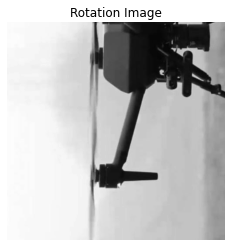

In [97]:
plt.imshow(dst3, cmap= "gray"), plt.axis("off"), plt.title("Rotation Image");

<a id = "23"></a><br>
# Harris Corner Detection

Harris Corner Detection is a grayscale image with scores. Thresholding for a suitable score gives you the corners in the image. We will do it with a simple image.

OpenCV has the function cv2.cornerHarris() for this purpose. Its arguments are:

* src: Input single-channel 8-bit or floating-point image. It should be grayscale and float32 type.
* dst: Image to store the Harris detector responses. It has the type CV_32FC1 and the same size as src .
* blockSize: It is the size of neighbourhood considered for corner detection.
* ksize: Aperture parameter for the Sobel operator.
* k: Harris detector free parameter in the equation. See the formula above.

In [98]:
chessboard= cv2.imread("...\\Github\\Basic OpenCV Tutorial\\Images\\chessboard.png")

gray= cv2.cvtColor(chessboard, cv2.COLOR_BGR2GRAY)

gray = np.float32(gray)
dst = cv2.cornerHarris(gray, blockSize= 3, ksize= 3, k= 0.1)

#result is dilated for marking the corners, not important
dst = cv2.dilate(dst,None)

# Threshold for an optimal value, it may vary depending on the image.
chessboard[dst>0.01*dst.max()]= [0,0,255]

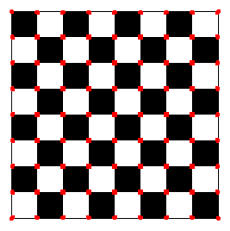

In [99]:
plt.imshow(chessboard[:,:,[2,1,0]]), plt.axis("off")
plt.show()

In [100]:
cv2.imshow("Chessboard", chessboard)
cv2.waitKey(0)
cv2.destroyAllWindows()

<a id = "24"></a><br>
# Shi-Tomasi Corner Detector & Good Features to Track

OpenCV has a function, cv2.goodFeaturesToTrack(). It finds N strongest corners in the image by Shi-Tomasi method (or Harris Corner Detection, if you specify it). Image should be a grayscale image. Then you specify number of corners you want to find. Then you specify the quality level, which is a value between 0-1, which denotes the minimum quality of corner below which everyone is rejected. Then this function provide the minimum euclidean distance between corners detected.

With all this information, the function finds corners in the image. All corners below quality level are rejected. Then it sorts the remaining corners based on quality in the descending order. Then function takes first strongest corner, throws away all the nearby corners in the range of minimum distance and returns N strongest corners.

In below example, we will try to find 30 best corners:

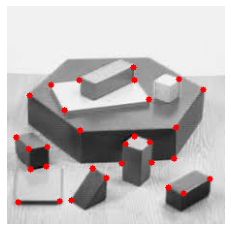

In [101]:
blox= cv2.imread("...\\Github\\Basic OpenCV Tutorial\\Images\\blox.jpg")

gray = cv2.cvtColor(blox, cv2.COLOR_BGR2GRAY)

corners = cv2.goodFeaturesToTrack(gray, maxCorners= 30, qualityLevel= .1, minDistance= 5)
corners = np.int0(corners)

for corner in corners:
    x,y = corner.ravel()
    cv2.circle(blox,(x,y),3,(255,0,0),-1)
    
plt.imshow(blox), plt.axis("off")
plt.show()

<a id = "25"></a><br>
# Image Gradients

OpenCV provides three types of gradient filters or High-pass filters, Sobel, Scharr and Laplacian. We will see each one of them.

###### 1. Sobel and Scharr Derivatives
Sobel operators is a joint Gausssian smoothing plus differentiation operation, so it is more resistant to noise. You can specify the direction of derivatives to be taken, vertical or horizontal. You can also specify the size of kernel by the argument ksize. If ksize = -1, a 3x3 Scharr filter is used which gives better results than 3x3 Sobel filter.

###### 2. Laplacian Derivatives
It calculates the Laplacian of the image where each derivative is found using Sobel derivatives.   

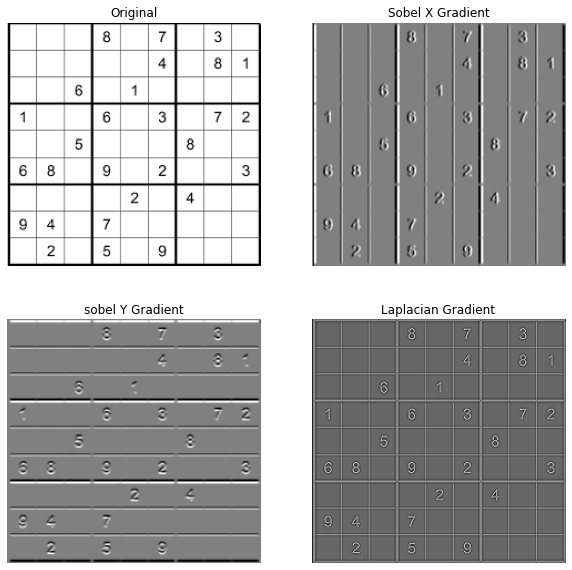

In [102]:
sudoku= cv2.imread("...\\Github\\Basic OpenCV Tutorial\\Images\\sudoku.png", 0)

# sobel x gradyan 
sobelX= cv2.Sobel(sudoku, ddepth= cv2.CV_16S, dx= 1, dy= 0, ksize= 3)

# sobel y gradyan 
sobelY= cv2.Sobel(sudoku, ddepth= cv2.CV_16S, dx= 0, dy= 1, ksize= 3)

# laplacian gradyan
laplacian= cv2.Laplacian(sudoku, ddepth= cv2.CV_16S)

plt.figure(figsize= (10,10))
plt.subplot(221), plt.imshow(sudoku, cmap= "gray"), plt.axis("off"), plt.title("Original")
plt.subplot(222), plt.imshow(sobelX, cmap= "gray"), plt.axis("off"), plt.title("Sobel X Gradient")
plt.subplot(223), plt.imshow(sobelY, cmap= "gray"), plt.axis("off"), plt.title("sobel Y Gradient")
plt.subplot(224), plt.imshow(laplacian, cmap= "gray"), plt.axis("off"), plt.title("Laplacian Gradient")
plt.show()

<a id = "26"></a><br>
# Canny Edge Detection

OpenCV has a function, cv2.Canny(). We will see how to use it. First argument is our input image. Second and third arguments are our minVal and maxVal respectively. Third argument is aperture_size. It is the size of Sobel kernel used for find image gradients. By default it is 3. Last argument is L2gradient which specifies the equation for finding gradient magnitude. By default, it is False.

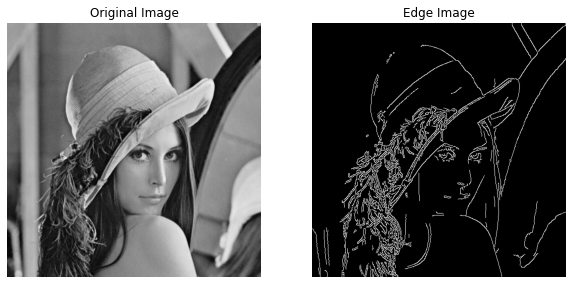

In [103]:
lenna= cv2.imread("...\\Github\\Basic OpenCV Tutorial\\Images\\lenna.png", 0)

edges = cv2.Canny(lenna, threshold1= 100, threshold2= 200)

plt.figure(figsize= (10,10))
plt.subplot(121),plt.imshow(lenna,cmap = 'gray'), plt.title('Original Image'), plt.axis("off")
plt.subplot(122),plt.imshow(edges,cmap = 'gray'), plt.title('Edge Image'), plt.axis("off")
plt.show()

<a id = "27"></a><br>
# Contours

###### What are contours?

Contours can be explained simply as a curve joining all the continuous points (along the boundary), having same color or intensity. The contours are a useful tool for shape analysis and object detection and recognition.

For better accuracy, use binary images. So before finding contours, apply threshold or canny edge detection.
Since OpenCV 3.2, findContours() no longer modifies the source image but returns a modified image as the first of two return parameters.
In OpenCV, finding contours is like finding white object from black background. So remember, object to be found should be white and background should be black.

There are three arguments in cv2.findContours() function, first one is source image, second is contour retrieval mode, third is contour approximation method. And it outputs a the contours and hierarchy. contours is a Python list of all the contours in the image. Each individual contour is a Numpy array of (x,y) coordinates of boundary points of the object.

In [104]:
img= cv2.imread("...\\Desktop\\Github\\Basic OpenCV Tutorial\\Images\\contour.png")

imgray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

ret, thresh = cv2.threshold(imgray, 130, 255, 0)

contours, hierarchy = cv2.findContours(image= thresh, 
                                       mode= cv2.RETR_TREE, 
                                       method= cv2.CHAIN_APPROX_SIMPLE)

###### Contour Approximation Method
This is the third argument in cv2.findContours function. What does it denote actually?

Above, we told that contours are the boundaries of a shape with same intensity. It stores the (x,y) coordinates of the boundary of a shape. But does it store all the coordinates ? That is specified by this contour approximation method.

If you pass cv2.CHAIN_APPROX_NONE, all the boundary points are stored. But actually do we need all the points? For eg, you found the contour of a straight line. Do you need all the points on the line to represent that line? No, we need just two end points of that line. This is what cv2.CHAIN_APPROX_SIMPLE does. It removes all redundant points and compresses the contour, thereby saving memory.

Below image of a rectangle demonstrate this technique. Just draw a circle on all the coordinates in the contour array (drawn in blue color). First image shows points I got with cv2.CHAIN_APPROX_NONE (734 points) and second image shows the one with cv2.CHAIN_APPROX_SIMPLE (only 4 points). See, how much memory it saves!!!

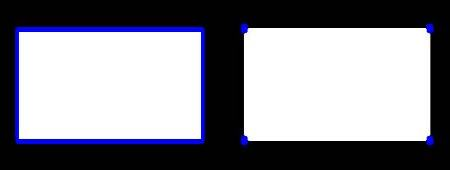

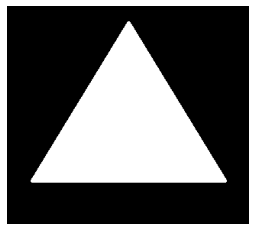

In [105]:
plt.imshow(thresh, cmap= "binary"), plt.axis("off");

###### How to draw the contours?
To draw the contours, cv2.drawContours function is used. It can also be used to draw any shape provided you have its boundary points. Its first argument is source image, second argument is the contours which should be passed as a Python list, third argument is index of contours (useful when drawing individual contour. To draw all contours, pass -1) and remaining arguments are color, thickness etc.

In [106]:
print("found number of contours: ", len(contours))

found number of contours:  2


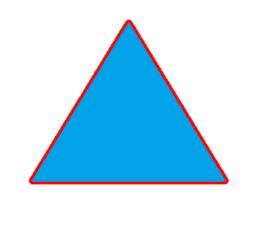

In [107]:
# To draw an individual contour, say 2th contour:
cv2.drawContours(img, contours, contourIdx= 1, color= (0,0,255), 
                 thickness= 2, lineType= cv2.LINE_AA,
                 hierarchy= hierarchy)

plt.imshow(img[:,:,[2,1,0]]), plt.axis("off");

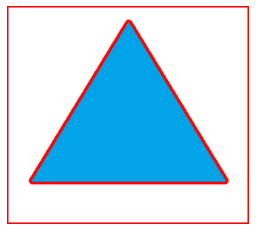

In [108]:
# To draw all the contours in an image:
cv2.drawContours(img, contours, -1, (0,0,255), 2)
plt.imshow(img[:,:,[2,1,0]]), plt.axis("off");

<a id = "28"></a><br>
## Contour Features

<a id = "29"></a><br>
### 1. Moments

Image moments help you to calculate some features like center of mass of the object, area of the object etc.

In [109]:
cnt = contours[1]
M = cv2.moments(cnt)
print( M )

{'m00': 28150.0, 'm10': 4476816.0, 'm01': 4488823.0, 'm20': 792640580.6666666, 'm11': 713879000.6666666, 'm02': 787699529.3333333, 'm30': 151716903036.0, 'm21': 128696075153.8, 'm12': 125271911554.0, 'm03': 146488903732.9, 'mu20': 80673209.5172528, 'mu11': 2104.4830787181854, 'mu02': 71907986.69287145, 'mu30': 232909.74057006836, 'mu21': 2300263004.708517, 'mu12': -15601.09873008728, 'mu03': -2051352517.968628, 'nu20': 0.10180580374390277, 'nu11': 2.655758864391389e-06, 'nu02': 0.0907445039645788, 'nu30': 1.7518287670121343e-06, 'nu21': 0.017301409951679832, 'nu12': -1.173435404009705e-07, 'nu03': -0.015429231699217482}


From this moments, you can extract useful data like area, centroid etc. 

In [110]:
cx = int(M['m10']/M['m00'])
cy = int(M['m01']/M['m00'])

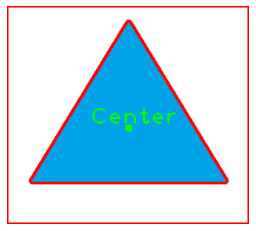

In [111]:
cv2.circle(img, (cx, cy), 5, (0,255,0), -1)
cv2.putText(img, "Center", (cx-50, cy-5), cv2.FONT_HERSHEY_PLAIN, 2, (0,255,0), 2)
plt.imshow(img[:,:,[2,1,0]]), plt.axis("off");

<a id = "30"></a><br>
### 2. Contour Area

Contour area is given by the function cv2.contourArea() or from moments, M['m00'].

In [112]:
area = cv2.contourArea(cnt)

In [113]:
print("Calculated area using cv2.contourArea func: ", area)
print("Calculated area using cv2.moments func: ", M["m00"])

Calculated area using cv2.contourArea func:  28150.0
Calculated area using cv2.moments func:  28150.0


<a id = "31"></a><br>
### 3. Contour Perimeter

It is also called arc length. It can be found out using cv2.arcLength() function. Second argument specify whether shape is a closed contour (if passed True), or just a curve.

In [114]:
perimeter = cv2.arcLength(cnt,True)
print("Perimeter: ", perimeter)

Perimeter:  787.6955199241638


<a id = "32"></a><br>
### 4. Contour Approximation

It approximates a contour shape to another shape with less number of vertices depending upon the precision we specify. It is an implementation of [Douglas-Peucker](https://en.wikipedia.org/wiki/Ramer%E2%80%93Douglas%E2%80%93Peucker_algorithm) algorithm.

To understand this, suppose you are trying to find a square in an image, but due to some problems in the image, you didn't get a perfect square, but a "bad shape". Now you can use this function to approximate the shape. In this, second argument is called epsilon, which is maximum distance from contour to approximated contour. It is an accuracy parameter. A wise selection of epsilon is needed to get the correct output.

In [115]:
img= cv2.imread("...\\Github\\Basic OpenCV Tutorial\\Images\\approx.png")
img2= img.copy()

In [116]:
imgray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

ret, thresh = cv2.threshold(imgray, 120, 255, cv2.THRESH_BINARY)

contours, _ = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

In [117]:
cnt= contours[0]

In [118]:
epsilon = .01*cv2.arcLength(cnt,True)
approx = cv2.approxPolyDP(cnt,epsilon,True)

In [119]:
print("First Contour length: ", len(cnt))
print("Approx length: ", len(approx))

First Contour length:  137
Approx length:  20


In [120]:
approx= []
for cnt in contours:
    epsilon= 0.05 * cv2.arcLength(cnt, True)
    approx.append(cv2.approxPolyDP(cnt,epsilon,True))

In [121]:
cv2.drawContours(img, approx, -1, (0,0,255), 2);
cv2.drawContours(img2, contours, -1, (0,0,255), 2);

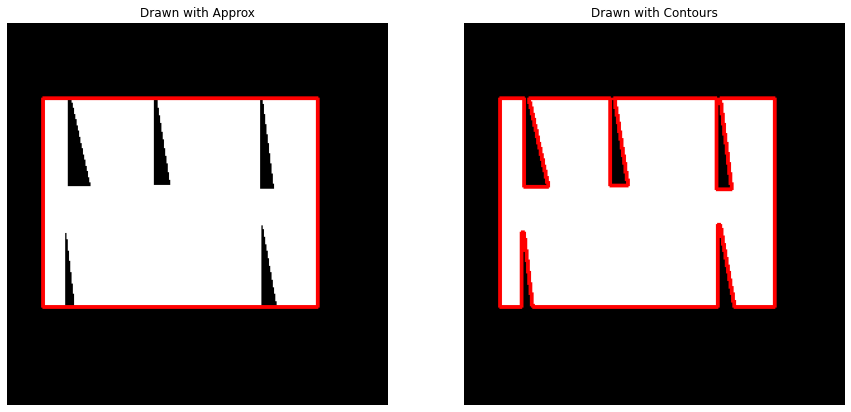

In [122]:
plt.figure(figsize= (15,10))
plt.subplot(121), plt.imshow(img[:,:,[2,1,0]]), plt.axis("off"), plt.title("Drawn with Approx")
plt.subplot(122), plt.imshow(img2[:,:,[2,1,0]]), plt.axis("off"), plt.title("Drawn with Contours")
plt.show()

<a id = "33"></a><br>
### 5. Convex Hull

Convex Hull will look similar to contour approximation, but it is not (Both may provide same results in some cases). Here, cv2.convexHull() function checks a curve for convexity defects and corrects it. Generally speaking, convex curves are the curves which are always bulged out, or at-least flat. And if it is bulged inside, it is called convexity defects.

In [123]:
map= cv2.imread("...\\Github\\Basic OpenCV Tutorial\\Images\\map.jpg")

In [124]:
gray = cv2.cvtColor(map, cv2.COLOR_BGR2GRAY)

_, thresh= cv2.threshold(gray, 28,255, cv2.THRESH_BINARY)

contours, _ = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

###### Arguments details:

* points are the contours we pass into.
* hull is the output, normally we avoid it.
* clockwise : Orientation flag. If it is True, the output convex hull is oriented clockwise. Otherwise, it is oriented counter-clockwise.
* returnPoints : By default, True. Then it returns the coordinates of the hull points. If False, it returns the indices of contour points corresponding to the hull points.

In [125]:
hull= []

for i in range(len(contours)):
    hull.append(cv2.convexHull(points= contours[i], hull= False, clockwise= True, returnPoints= True))

for i in range(len(contours)):
    
    if cv2.contourArea(contours[i]) > 200:
        
        cv2.drawContours(map, contours, i, (0,0,255), 2, 8)
        cv2.drawContours(map, hull, i, (0,255,0), 2, 8)
        
font= cv2.FONT_ITALIC
cv2.putText(map, "Convex Line", (10,map.shape[1]-30), font, 1, (0,255,0), 2);
cv2.putText(map, "Contour Line", (10,map.shape[1]-60), font, 1, (0,0,255), 2);

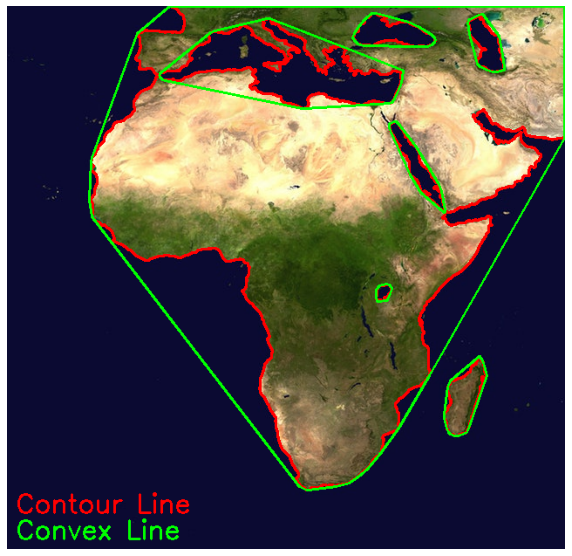

In [126]:
plt.figure(figsize= (10,10))
plt.imshow(map[:,:,[2,1,0]]), plt.axis("off");

In [127]:
hand= cv2.imread("...\\Github\\Basic OpenCV Tutorial\\Images\\hand.jpg")

In [128]:
gray = cv2.cvtColor(hand, cv2.COLOR_BGR2GRAY)

_, thresh= cv2.threshold(gray, 235,255, cv2.THRESH_BINARY_INV)

contours, _ = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

In [129]:
hull= []

for i in range(len(contours)):
    hull.append(cv2.convexHull(contours[i], False))
            
cv2.drawContours(hand, contours, -1, (0,0,255), 2)
cv2.drawContours(hand, hull, -1, (0,255,0), 2)
        
font= cv2.FONT_HERSHEY_SIMPLEX
cv2.putText(hand, "Convex Line", (350,hand.shape[1]-30), font, 1, (0,255,0), 2);
cv2.putText(hand, "Contour Line", (350,hand.shape[1]-60), font, 1, (0,0,255), 2);

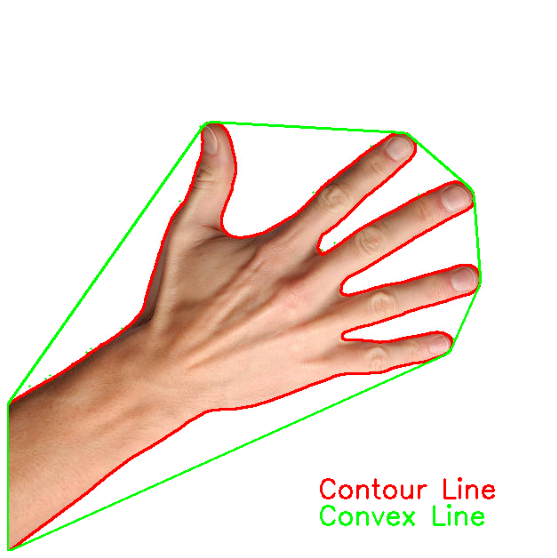

In [130]:
plt.figure(figsize= (10,10))
plt.imshow(hand[:,:,[2,1,0]]), plt.axis("off");

<a id = "34"></a><br>
### 6. Bounding Rectangle

* There are two types of bounding rectangles.

In [131]:
img= cv2.imread("...\\Github\\Basic OpenCV Tutorial\\Images\\boundrec.png")

gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

_, thresh= cv2.threshold(gray, 80,255, cv2.THRESH_BINARY)

contours, _ = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

<a id = "35"></a><br>
#### 6.1. Straight Bounding Rectangle

* It is a straight rectangle, it doesn't consider the rotation of the object. So area of the bounding rectangle won't be minimum. It is found by the function cv2.boundingRect().

* Let (x,y) be the top-left coordinate of the rectangle and (w,h) be its width and height.

In [132]:
cnt= contours[0]
x,y,w,h = cv2.boundingRect(cnt)
cv2.rectangle(img,(x,y),(x+w,y+h),(0,255,0),2);

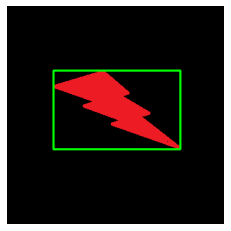

In [133]:
plt.imshow(img[:,:,[2,1,0]]), plt.axis("off");

<a id = "36"></a><br>
#### 6.2 Rotated Rectangle

* Here, bounding rectangle is drawn with minimum area, so it considers the rotation also. 
* The function used is cv2.minAreaRect(). It returns a Box2D structure which contains following details - ( center (x,y), (width, height), angle of rotation ). 
* But to draw this rectangle, we need 4 corners of the rectangle. It is obtained by the function cv2.boxPoints()

In [134]:
rect = cv2.minAreaRect(cnt)
box = cv2.boxPoints(rect)
box = np.int0(box)
cv2.drawContours(img,[box],0,(255,0,0),2);

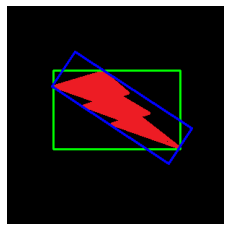

In [135]:
plt.imshow(img[:,:,[2,1,0]]), plt.axis("off");

<a id = "37"></a><br>
# Template Matching

Template Matching is a method for searching and finding the location of a template image in a larger image. OpenCV comes with a function cv2.matchTemplate() for this purpose. It simply slides the template image over the input image and compares the template and patch of input image under the template image. Several comparison methods are implemented in OpenCV. It returns a grayscale image, where each pixel denotes how much does the neighbourhood of that pixel match with template.

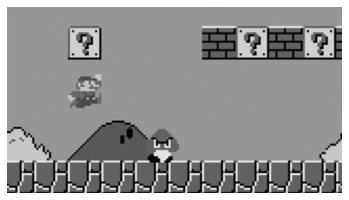

In [136]:
image_path = "...\\Github\\Basic OpenCV Tutorial\\Images\\mario.jpg"
img = cv2.imread(image_path)

gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

plt.imshow(gray, cmap= "gray"), plt.axis("off");

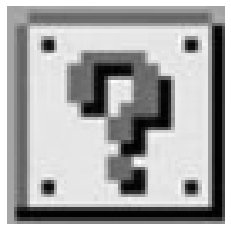

In [137]:
template = gray[35:100, 110:175]
w,h = template.shape[::-1]
plt.imshow(template, cmap= "gray"),  plt.axis("off");

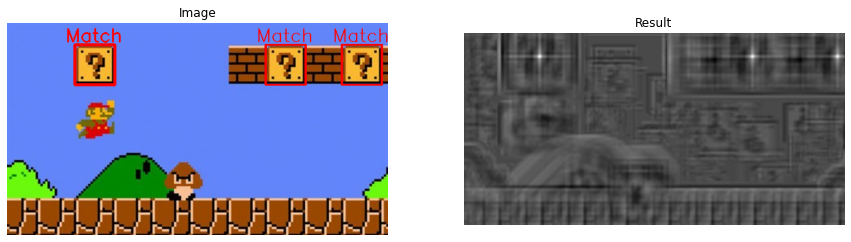

In [138]:
result = cv2.matchTemplate(gray,template,cv2.TM_CCOEFF_NORMED)
location = np.where(result >= 0.9)

for point in zip(*location[::-1]):
    x,y= point
    cv2.rectangle(img,(x,y),(x+w,y+h),(0,0,255),2)
    cv2.putText(img, "Match", (x-15, y-5), cv2.FONT_HERSHEY_SIMPLEX, 1, (0,0,255), 1)

plt.figure(figsize= (15,10))
plt.subplot(121), plt.imshow(img[:,:, [2,1,0]]), plt.axis("off"), plt.title("Image")
plt.subplot(122), plt.imshow(result, cmap= "gray"), plt.axis("off"), plt.title("Result")
plt.show()

<a id = "38"></a><br>
# Probabilistic Hough Line Transform

The Hough transform requires a lot of computation even for a row with two arguments. Probabilistic Hough Transform is an optimization of the Hough Transform. It doesn't take all the points into consideration. Instead, it takes only a random subset of points which is sufficient for line detection.

You can check [this](https://en.wikipedia.org/wiki/Hough_transform) for more information

HoughLinesP(image, rho, theta, threshold, lines, minLineLength, maxLineGap)

* image: 8-bit, single-channel binary source image. The image may be modified by the function.
* lines: Output vector of lines. Each line is represented by a 4-element vector
* rho: Distance resolution of the accumulator in pixels.
* theta: Angle resolution of the accumulator in radians.
* threshold: Accumulator threshold parameter. Only those lines are returned that get enough votes
* minLineLength: Minimum line length. Line segments shorter than that are rejected.
* maxLineGap: Maximum allowed gap between points on the same line to link them.

In [139]:
sudoku= cv2.imread("...\\Github\\Basic OpenCV Tutorial\\Images\\sudoku.png")

gray = cv2.cvtColor(sudoku,cv2.COLOR_BGR2GRAY)

edges = cv2.Canny(gray,50,150,apertureSize = 3)

lines = cv2.HoughLinesP(edges, rho= 1, theta= np.pi/180, threshold= 100, minLineLength= 100, maxLineGap= 10)

for line in lines:
    x1,y1,x2,y2 = line[0]
    cv2.line(sudoku,(x1,y1),(x2,y2),(0,255,0),2)

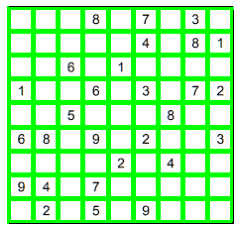

In [140]:
plt.imshow(sudoku), plt.axis("off");

<a id = "39"></a><br>
# Hough Circle Transform

A circle is represented mathematically as $\ (x−x_{center})^2+(y−y_{center})^2=r^2 \$

Where $\(x_{center},y_{center})\$ is the center of the circle, and r is the radius of the circle. From equation, we can see we have 3 parameters, so we need a 3D accumulator for hough transform, which would be highly ineffective. So OpenCV uses more trickier method, Hough Gradient Method which uses the gradient information of edges.

HoughCircles(image, method, dp, minDist, circles, param1, param2, minRadius, maxRadius)

* image: 8-bit, single-channel, grayscale input image.

* circles: Output vector of found circles. Each vector is encoded as  3 or 4 element floating-point vector .

* method: Detection method, see #HoughModes. The available methods are #HOUGH_GRADIENT and #HOUGH_GRADIENT_ALT.

* dp: Inverse ratio of the accumulator resolution to the image resolution. For example, if dp=1 , the accumulator has the same resolution as the input image. If dp=2 , the accumulator has half as big width and height. For #HOUGH_GRADIENT_ALT the recommended value is dp=1.5, unless some small very circles need to be detected.

* minDist: Minimum distance between the centers of the detected circles. If the parameter is too small, multiple neighbor circles may be falsely detected in addition to a true one. If it is too large, some circles may be missed.

* param1: First method-specific parameter. In case of #HOUGH_GRADIENT and #HOUGH_GRADIENT_ALT, it is the higher threshold of the two passed to the Canny edge detector (the lower one is twice smaller). Note that #HOUGH_GRADIENT_ALT uses #Scharr algorithm to compute image derivatives, so the threshold value shough normally be higher, such as 300 or normally exposed and contrasty images.

* param2: Second method-specific parameter. In case of #HOUGH_GRADIENT, it is the accumulator threshold for the circle centers at the detection stage. The smaller it is, the more false circles may be detected. Circles, corresponding to the larger accumulator values, will be returned first. In the case of #HOUGH_GRADIENT_ALT algorithm, this is the circle "perfectness" measure. The closer it to 1, the better shaped circles algorithm selects. In most cases 0.9 should be fine. If you want get better detection of small circles, you may decrease it to 0.85, 0.8 or even less. But then also try to limit the search range [minRadius, maxRadius] to avoid many false circles.

* minRadius: Minimum circle radius.

* maxRadius: Maximum circle radius. If <= 0, uses the maximum image dimension. If < 0, #HOUGH_GRADIENT returns centers without finding the radius. #HOUGH_GRADIENT_ALT always computes circle radiuses.

In [141]:
coins= cv2.imread("...\\Github\\Basic OpenCV Tutorial\\Images\\coins.jpg")

gray = cv2.cvtColor(coins,cv2.COLOR_BGR2GRAY)

circles = cv2.HoughCircles(gray, method= cv2.HOUGH_GRADIENT, dp= 1, minDist= coins.shape[0]/4, 
                           param1=200, param2=10,
                           minRadius=15, maxRadius=89)

circles = np.uint16(np.around(circles))

for i in circles[0,:]:
    # draw the outer circle
    cv2.circle(coins,(i[0],i[1]),i[2],(0,0,0),5)
    # draw the center of the circle
    cv2.circle(coins,(i[0],i[1]),5,(0,0,255),-1)

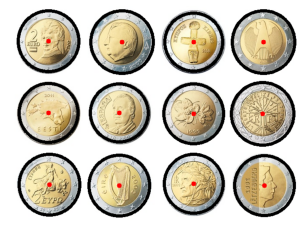

In [142]:
plt.imshow(coins[:,:,[2,1,0]]), plt.axis("off");

<a id = "40"></a><br>
# Haar Cascades

Object Detection using Haar feature-based cascade classifiers is an effective object detection method proposed by Paul Viola and Michael Jones in their paper, ["Rapid Object Detection using a Boosted Cascade of Simple Features"](https://ieeexplore.ieee.org/document/990517) in 2001. It is a machine learning based approach where a cascade function is trained from a lot of positive and negative images. It is then used to detect objects in other images.

<a id = "41"></a><br>
## 1. Face Detection

[Click](https://github.com/opencv/opencv/blob/master/data/haarcascades/haarcascade_frontalcatface.xml) for frontalface.xml file

In [143]:
butcher= cv2.imread("...\\Github\\Basic OpenCV Tutorial\\Images\\butcher.jpg")
gray= cv2.cvtColor(butcher, cv2.COLOR_BGR2GRAY)

In [144]:
face_path= "...\\Github\\Basic OpenCV Tutorial\\Haar Cascades\\frontalface.xml"
face_cascade= cv2.CascadeClassifier(face_path)

detectMultiScale(image, scaleFactor, minNeighbors, flags, minSize, maxSize) 

* scaleFactor: Parameter specifying how much the image size is reduced at each image scale.
* minNeighbors : Parameter specifying how many neighbors each candidate rectangle should have to retain it.
* flags: Parameter with the same meaning for an old cascade as in the function cvHaarDetectObjects. It is not used for a new cascade.
* minSize: Minimum possible object size. Objects smaller than that are ignored.
* maxSize Maximum possible object size. Objects larger than that are ignored. If `maxSize == minSize` model is evaluated on single scale.

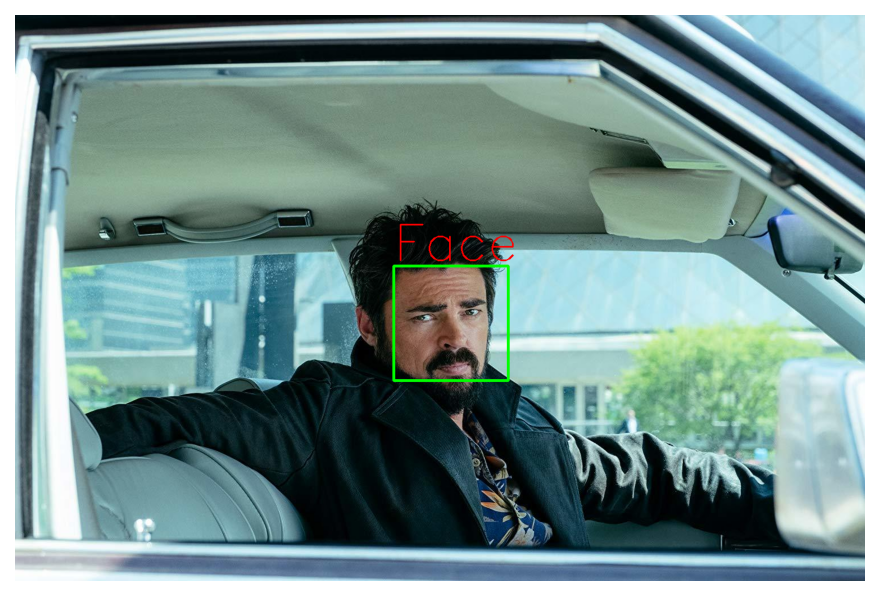

In [145]:
faces= face_cascade.detectMultiScale(gray, scaleFactor= 1.1, minNeighbors= 4)

for (x,y,w,h) in faces:

    cv2.rectangle(butcher,(x,y),(x+w,y+h),(0,255,0),3)
    cv2.putText(butcher, "Face" ,(x, y-10), cv2.FONT_HERSHEY_SIMPLEX, 3, (0,0,255),2)
    
plt.figure(figsize= (10,5), dpi= 150)
plt.imshow(butcher[:,:,[2,1,0]]), plt.axis("off");

<a id = "42"></a><br>
## 2. Eye Detection

[Click](https://github.com/opencv/opencv/blob/master/data/haarcascades/haarcascade_eye.xml) for eye.xml file

In [146]:
karl= cv2.imread("...\\Github\\Basic OpenCV Tutorial\\Images\\karl.jpg")
gray= cv2.cvtColor(karl, cv2.COLOR_BGR2GRAY)

In [147]:
eye_path= "...\\Github\\Basic OpenCV Tutorial\\Haar Cascades\\eye.xml"
eye_cascade= cv2.CascadeClassifier(eye_path)

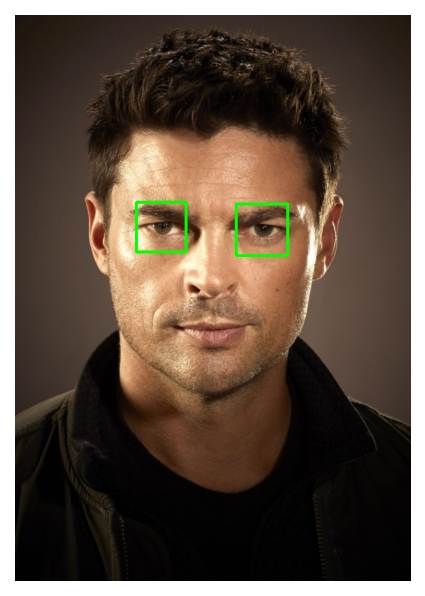

In [148]:
eyes= eye_cascade.detectMultiScale(gray, 1.2, 5)

for (x,y,w,h) in eyes:

    cv2.rectangle(karl,(x,y),(x+w,y+h),(0,255,0),3)
    
plt.figure(figsize= (10,5), dpi= 150)
plt.imshow(karl[:,:,[2,1,0]]), plt.axis("off");

<a id = "43"></a><br>
## 3. Mouth Detection

[Click](https://github.com/sightmachine/SimpleCV/blob/master/SimpleCV/Features/HaarCascades/mouth.xml) for mouth.xml file

In [149]:
karl= cv2.imread("...\\Github\\Basic OpenCV Tutorial\\Images\\karl.jpg")
gray= cv2.cvtColor(karl, cv2.COLOR_BGR2GRAY)

In [150]:
mouth_path= "...\\Github\\Basic OpenCV Tutorial\\Haar Cascades\\mouth.xml"
mouth_cascade= cv2.CascadeClassifier(mouth_path)

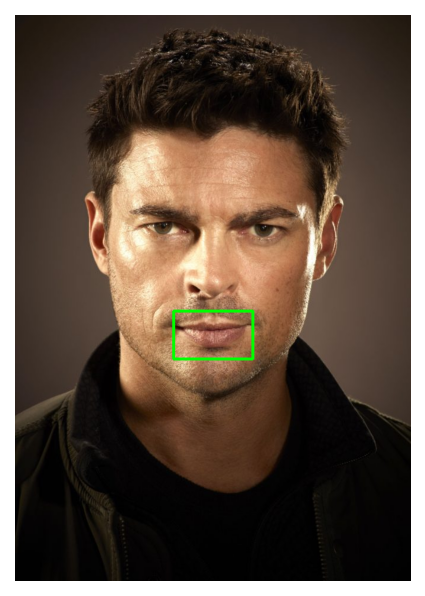

In [151]:
mouths= mouth_cascade.detectMultiScale(gray, 1.4, 12)

for (x,y,w,h) in mouths:

    cv2.rectangle(karl,(x,y),(x+w,y+h),(0,255,0),3)
    
plt.figure(figsize= (10,5), dpi= 150)
plt.imshow(karl[:,:,[2,1,0]]), plt.axis("off");

<a id = "44"></a><br>
## 4. Smile Detection

[Click](https://github.com/opencv/opencv/blob/master/data/haarcascades/haarcascade_smile.xml) for smile.xml file

In [152]:
smile= cv2.imread("...\\Basic OpenCV Tutorial\\Images\\smile_baby.jpg")
gray= cv2.cvtColor(smile, cv2.COLOR_BGR2GRAY)

In [153]:
smile_path= "...\\Github\\Basic OpenCV Tutorial\\Haar Cascades\\smile.xml"
smile_cascade= cv2.CascadeClassifier(smile_path)

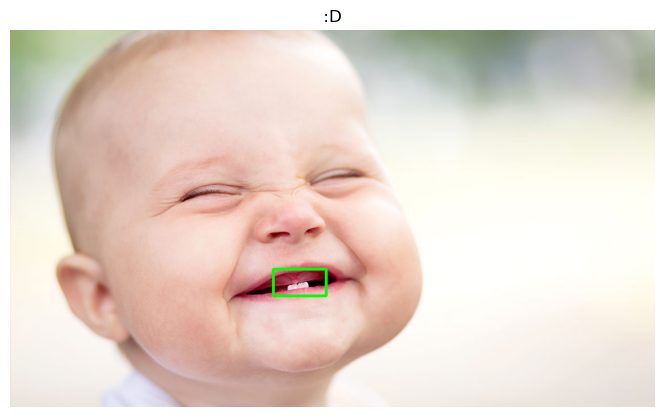

In [154]:
smiles= smile_cascade.detectMultiScale(gray, 1.1, 5, minSize= (84,84), maxSize= (84,84) )

(x,y,w,h)= smiles[1]

cv2.rectangle(smile,(x,y),(x+w,y+h),(0,255,0),3)

#It took a little long to detect teeth but it was nice

plt.figure(figsize= (10,5), dpi= 100)
plt.imshow(smile[:,:,[2,1,0]]), plt.axis("off"), plt.title(" :D ");

In [155]:
smile= cv2.imread("...\\Github\\Basic OpenCV Tutorial\\Images\\smile.jpg")
gray= cv2.cvtColor(smile, cv2.COLOR_BGR2GRAY)

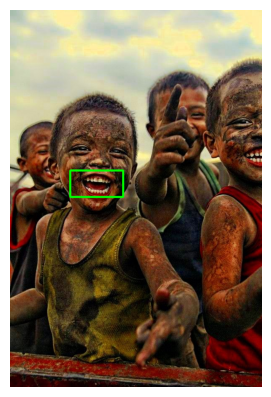

In [156]:
smiles= smile_cascade.detectMultiScale(gray, 3.5, 25)

for (x,y,w,h) in smiles:

    cv2.rectangle(smile,(x,y),(x+w,y+h),(0,255,0),3)
    
plt.figure(figsize= (10,5), dpi= 100)
plt.imshow(smile[:,:,[2,1,0]]), plt.axis("off");

In [157]:
smile= cv2.imread("...\\Github\\Basic OpenCV Tutorial\\Images\\blly_smile.jpg")
gray= cv2.cvtColor(smile, cv2.COLOR_BGR2GRAY)

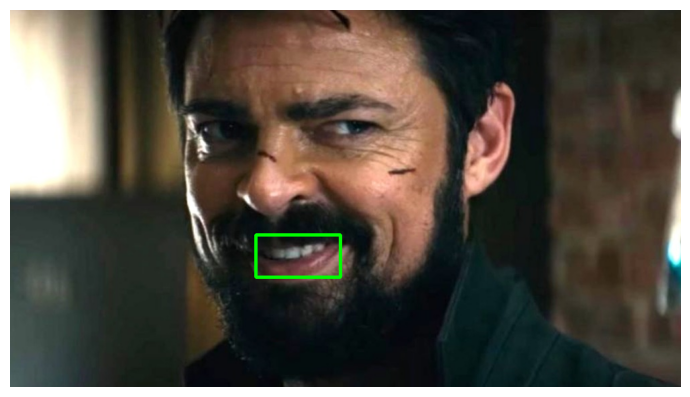

In [158]:
smiles= smile_cascade.detectMultiScale(gray, 3.5, 25)

for (x,y,w,h) in smiles:

    cv2.rectangle(smile,(x,y),(x+w,y+h),(0,255,0),3)
    
plt.figure(figsize= (10,5), dpi= 100)
plt.imshow(smile[:,:,[2,1,0]]), plt.axis("off");

<a id = "45"></a><br>
## 5. Simple Mask Detection

If we think of a person wearing a mask, we can see its face. But we can't see its mouth because it's wearing a mask. We will develop our algorithm in this way. First, we will detect its face through the image, then we will search for a mouth in the face area. If mouth is detected, it means it is not wearing a mask.

* 1- Face Detection
* 2- Mouth Detection in the face area
* 3.1- If mouth is detected : With Mask
* 3.2- If mouth is not detected: Without Mask 

In [159]:
path1= "...\\Github\\Basic OpenCV Tutorial\\Images\\mask.jpeg"
path2= "...\\Github\\Basic OpenCV Tutorial\\Images\\mask2.jpg"

img= cv2.imread(path1)
img2= cv2.imread(path2)

gray= cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
gray2= cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

In [160]:
face_path= "...\\Github\\Basic OpenCV Tutorial\\Haar Cascades\\frontalface.xml"
face_cascade= cv2.CascadeClassifier(face_path)
mouth_path= "...\\Github\\Basic OpenCV Tutorial\\Haar Cascades\\mouth.xml"
mouth_cascade= cv2.CascadeClassifier(mouth_path)

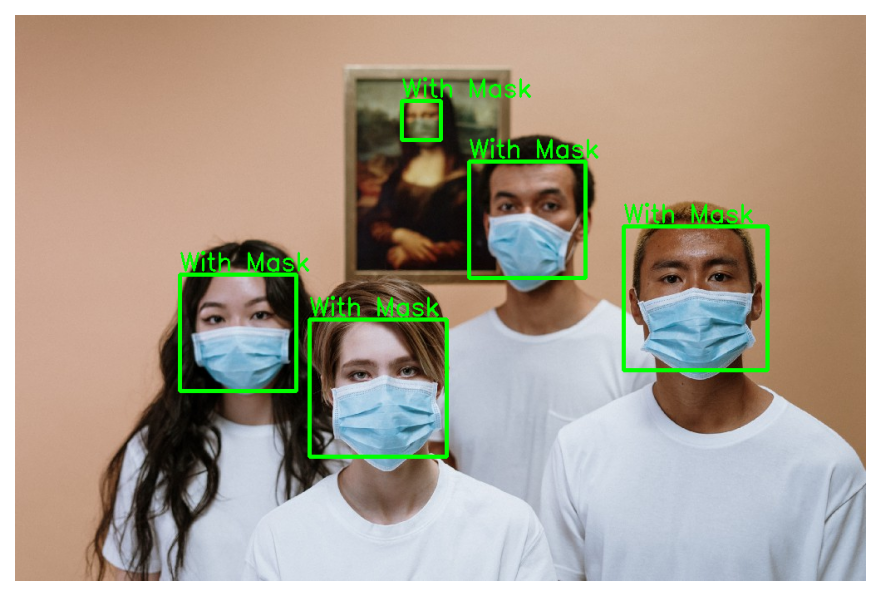

In [161]:
faces= face_cascade.detectMultiScale(gray, 1.1,2) # face detecting
font= cv2.FONT_HERSHEY_SIMPLEX

for (x,y,w,h) in faces:
    
    face= gray[y:y+h, x:x+w] # only take the face area in the image
    mouths= mouth_cascade.detectMultiScale(face, 1.4,12) # mouth detecting in the face area
    
    if len(mouths)== 0: # if mouth is not detected --> with mask
        
        cv2.rectangle(img,(x,y),(x+w,y+h),(0,255,0),3)
        cv2.putText(img, "With Mask", (x,y-5), font, 1, (0,255,0), 2)
        
    else:
        
        cv2.rectangle(img,(x,y),(x+w,y+h),(0,0,255),3)
        cv2.putText(img, "Without Mask", (x,y-5), font, 1, (0,0,255), 2)
        
plt.figure(figsize= (10,5), dpi= 150)
plt.imshow(img[:,:,[2,1,0]]), plt.axis("off");

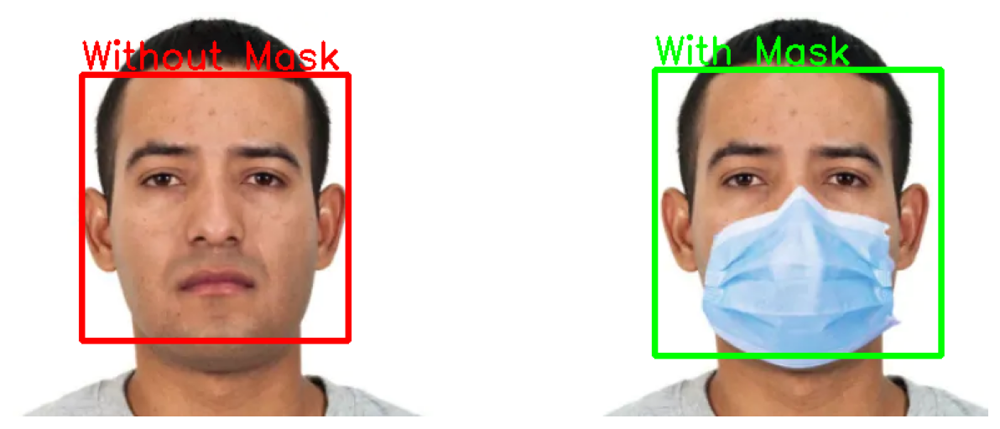

In [162]:
faces= face_cascade.detectMultiScale(gray2, 1.1,2)

for (x,y,w,h) in faces:
    
    face= gray2[y:y+h, x:x+w]
    mouths= mouth_cascade.detectMultiScale(face, 1.4,12)
    
    if len(mouths)== 0:
        
        cv2.rectangle(img2,(x,y),(x+w,y+h),(0,255,0),3)
        cv2.putText(img2, "With Mask", (x,y-5), font, 1, (0,255,0), 2)
        
    else:
        
        cv2.rectangle(img2,(x,y),(x+w,y+h),(0,0,255),3)
        cv2.putText(img2, "Without Mask", (x,y-5), font, 1, (0,0,255), 2)
        
plt.figure(figsize= (10,5), dpi= 150)
plt.imshow(img2[:,:,[2,1,0]]), plt.axis("off");